# Imports

In [276]:
import sys
import tensorflow as tf
import numpy as np
import itertools
import os
import time

import matplotlib
import matplotlib.pyplot as plt
from pathlib import Path

import pandas as pd
import pyemma
import mdtraj
import nglview as nv #conda install nglview -c conda-forge

sys.path.append('gmvae')
from model import GMVAE
from dataset import load_and_mix_data_nolabel

matplotlib.rcParams.update({'font.size': 24})

# Paths

In [170]:
readdir = 'data/'
savedir = 'results/'
modeldir = 'models/'
simroot = '/home/wright/GL13Kseries/500nsruns/'
simdirs = ['GL13Kanalysed','GL13Kneutralanalysed','GL13KR1analysed',
          'GL13KR1neutralanalysed','GL13KA5analysed','GL13KA7analysed',
          'GL13KA11analysed']

# Data Analysis
## Load Trajectories with Pyemma

In [171]:
datas = []
for s in simdirs:
    print(s)
    gro = simroot+s+'/md_whole.gro'
    xtc = simroot+s+'/md_0_1_aligned.xtc'
    feat = pyemma.coordinates.featurizer(gro)
    feat.add_backbone_torsions(periodic=False)
    data = pyemma.coordinates.load(xtc, features=feat)
    datas.append(data)
    print("loaded array of size {}".format(data.shape))
    print(feat.describe())

GL13Kanalysed
loaded array of size (50214, 24)
['PHI 0 LYS 2', 'PSI 0 GLY 1', 'PHI 0 ILE 3', 'PSI 0 LYS 2', 'PHI 0 ILE 4', 'PSI 0 ILE 3', 'PHI 0 LYS 5', 'PSI 0 ILE 4', 'PHI 0 LEU 6', 'PSI 0 LYS 5', 'PHI 0 LYS 7', 'PSI 0 LEU 6', 'PHI 0 ALA 8', 'PSI 0 LYS 7', 'PHI 0 SER 9', 'PSI 0 ALA 8', 'PHI 0 LEU 10', 'PSI 0 SER 9', 'PHI 0 LYS 11', 'PSI 0 LEU 10', 'PHI 0 LEU 12', 'PSI 0 LYS 11', 'PHI 0 LEU 13', 'PSI 0 LEU 12']
GL13Kneutralanalysed
loaded array of size (50261, 24)
['PHI 0 LSN 2', 'PSI 0 GLY 1', 'PHI 0 ILE 3', 'PSI 0 LSN 2', 'PHI 0 ILE 4', 'PSI 0 ILE 3', 'PHI 0 LSN 5', 'PSI 0 ILE 4', 'PHI 0 LEU 6', 'PSI 0 LSN 5', 'PHI 0 LSN 7', 'PSI 0 LEU 6', 'PHI 0 ALA 8', 'PSI 0 LSN 7', 'PHI 0 SER 9', 'PSI 0 ALA 8', 'PHI 0 LEU 10', 'PSI 0 SER 9', 'PHI 0 LSN 11', 'PSI 0 LEU 10', 'PHI 0 LEU 12', 'PSI 0 LSN 11', 'PHI 0 LEU 13', 'PSI 0 LEU 12']
GL13KR1analysed
loaded array of size (50437, 24)
['PHI 0 GLY 2', 'PSI 0 ILE 1', 'PHI 0 ILE 3', 'PSI 0 GLY 2', 'PHI 0 LYS 4', 'PSI 0 ILE 3', 'PHI 0 LEU 5', 'PSI 0 L

We can see that this has loaded the $(\phi,\psi)$ angles in order of the residue, as we might have expected. Thus it is relatively simple to expand each entry into the corresponding sine and cosine.

In [175]:
#make all of them 50001, take the cos/sine of each one, and end up with a giant matrix
dsize = 50001
allsimdata = np.zeros((dsize*len(datas),2*len(feat.describe())))
for d in range(len(datas)):
    datatrim = datas[d][0:dsize,:]
    print(datatrim[0])
    for col in range(datatrim.shape[1]):
        allsimdata[(d*dsize):((d+1)*dsize),2*col] = np.cos(datatrim[:,col])
        allsimdata[(d*dsize):((d+1)*dsize),2*col+1] = np.sin(datatrim[:,col])
#reserve 10% of data for model comparison
m = allsimdata.shape[0]
indices = np.random.permutation(m)
allsimdata=allsimdata[indices,:]
simtestdata=allsimdata[:int(0.1*allsimdata.shape[0]),:].copy()
mostsimdata=allsimdata[int(0.1*allsimdata.shape[0]):,:].copy()
mostindices = indices[int(0.1*allsimdata.shape[0]):].copy()
dataset = load_and_mix_data_nolabel(data=mostsimdata, test_ratio=0.01,randomize=True)

[-0.9322134   2.896723   -1.382053   -0.745881   -1.6823913   2.3636267
 -1.7020972   2.1111841  -1.1568294   0.20166767 -0.9615383   2.7001817
 -1.0021068  -0.8019937  -1.2755928  -0.8388356  -0.9130533  -0.41110063
 -1.217546   -0.80319256 -1.2779598  -0.372298   -1.0640305  -0.49829426]
[-0.8473556   1.9316972  -1.1024227  -0.88400424 -1.764505    2.5973632
 -1.748184    2.2212586  -1.6817521  -0.5337954  -1.0771389   1.9649284
 -0.805111   -0.75612944 -1.2212203  -0.8313779  -1.1215537  -0.566584
 -1.0783297  -0.6955085  -1.0800444  -0.6887583  -1.2485837  -0.67776304]
[-1.0221097   2.6276019  -1.0264357  -0.59019965 -1.5395876  -0.7578424
 -1.136088   -0.5465569  -1.1241207  -0.86573756 -1.0573567  -0.6607785
 -1.2246858  -0.65335566 -1.0430008  -0.60602164 -1.1827712  -0.7627708
 -1.0091202  -0.7524513  -1.1435319  -0.7408611  -1.381031   -0.7710207 ]
[-1.9322339  -0.06871086 -1.1932559   0.30742058 -1.2900553  -0.60145915
 -1.2998009  -0.56940335 -1.0067537  -0.8840112  -1.37284

In [173]:
indices

array([ 79733, 323938, 209721, ...,   7498, 323744, 247827])

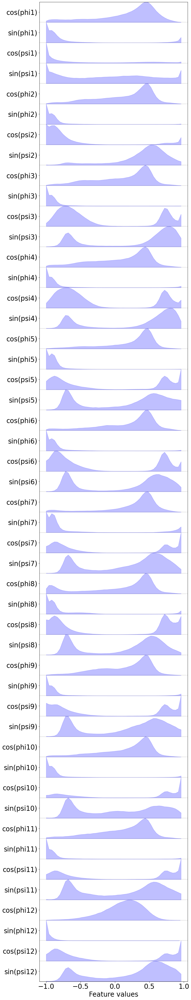

In [174]:
labels = []
for li in range(int(len(feat.describe())/2)):
    labels.append('cos(phi{})'.format(li+1))
    labels.append('sin(phi{})'.format(li+1))
    labels.append('cos(psi{})'.format(li+1))
    labels.append('sin(psi{})'.format(li+1))
fig,ax = plt.subplots(1,1,figsize=(10,50))
pyemma.plots.plot_feature_histograms(mostsimdata, feature_labels=labels,ax=ax)
plt.tight_layout()
fig.savefig(savedir+'initial_histograms.png')

# Training

graph written


2022-03-02 15:19:07.683831: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:19:07.683891: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  2.26e+00,  5.28e+01,  2.30e+00,  5.25e+01,         1
Sample of qy
0.13 0.13 0.09 0.09 0.09 0.09 0.11 0.09 0.10 0.10 
0.10 0.12 0.10 0.10 0.10 0.10 0.11 0.10 0.10 0.10 
0.10 0.10 0.10 0.12 0.10 0.10 0.10 0.10 0.10 0.10 
0.10 0.11 0.09 0.09 0.11 0.09 0.09 0.12 0.10 0.10 
0.11 0.12 0.09 0.09 0.09 0.09 0.09 0.09 0.13 0.09 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  1.71e-01,  1.36e+01,  1.70e-01,  1.31e+01,        51
Sample of qy
0.00 0.00 0.00 0.00 0.65 0.35 0.00 0.00 0.00 0.00 
1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.17 0.02 0.00 0.00 0.00 0.00 0.00 0.80 0.00 
0.00 0.00 0.00 0.00 0.89 0.11 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 0.00 0.00 1.00 0.00 0.00 

epoch:        100                                

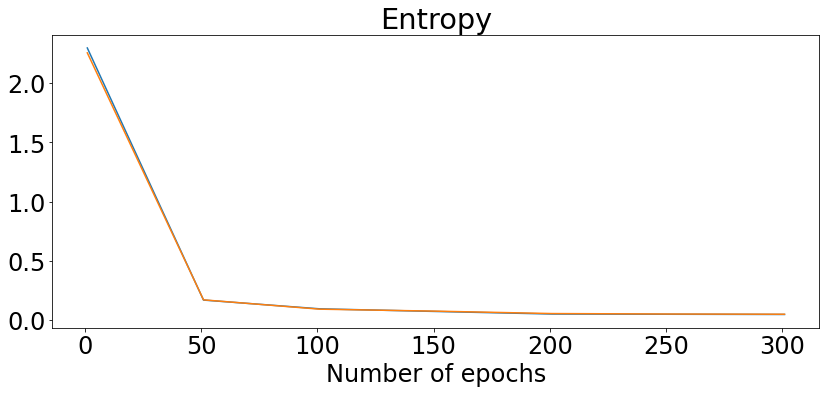

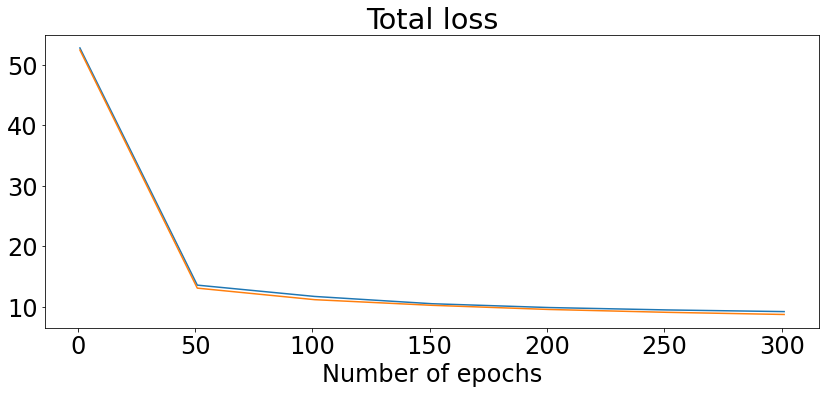

In [266]:
k, n_x, n_z, n_epochs = 10, 48, 2, 301
qy_dims = [16,16]
qz_dims = [16,16]
pz_dims = [16,16]
px_dims = [16,16]
r_nent = 0.3
batch_size = 10000
lr = 0.001
modelname='GL13Kmodel_'
def train_gmvae(k,n_x,n_z,n_epochs,
               qy_dims,qz_dims,pz_dims,px_dims,
               r_nent,batch_size,lr,modelname):
    

    model_path = modeldir + modelname +str(k)+'_'+str(n_z)+'_'+str(n_epochs)+'_'+str(r_nent)+'_' + str(batch_size)
    results = '_results'

    if not os.path.exists(model_path):
        os.makedirs(model_path)

    results_dir_s = model_path+results

    if not os.path.exists(results_dir_s):
        os.makedirs(results_dir_s)

    results_dir = Path(results_dir_s)

    model = GMVAE(model_path, k=k, n_x=n_x, n_z=n_z, qy_dims = qy_dims,
                  qz_dims = qz_dims, pz_dims = pz_dims, px_dims = px_dims,
                  r_nent = r_nent, batch_size=batch_size, lr=lr)
    saver = tf.train.Saver()

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        history, ye, ze = model.train(dataset, sess, epochs=n_epochs,
                                      n_train_eval=200000, n_test_eval=200000, save_parameters=True, 
                                      is_labeled=False, track_losses=True, verbose=True)

    f = open(model_path + '/training_params.txt','w+')
    f.write(f'k={k}, n_x={n_x}, n_z={n_z}, n_epochs={n_epochs}, qy_dims={qy_dims}, qz_dims={qz_dims}, '+
            f'pz_dims={pz_dims}, px_dims={px_dims}, r_ent={r_nent}, batch_size={batch_size}, lr={lr}')
    raw_data = {'k': [k], 'n_x': [n_x], 'n_z': [n_z], 'n_epochs': [n_epochs], 'qy_dims': [qy_dims], 'qz_dims': [qz_dims], 'pz_dims': [pz_dims], 
                'px_dims': [px_dims], 'r_nent': [r_nent], 'batch_size': [batch_size], 'lr': [lr]}
    df = pd.DataFrame(data=raw_data)
    df.to_pickle(model_path + '/training_params.pkl')
    f.close()
    fig, axes = plt.subplots(figsize = (12,6), nrows=1, ncols=1)
    axes.plot(history['iters'], history['val_ent'])
    axes.plot(history['iters'], history['ent'])
    axes.set_title('Entropy')
    axes.set_xlabel('Number of epochs')
    plt.tight_layout() 
    plt.savefig(str(results_dir) + 'training_ent.png')
    plt.show()
    
    fig, axes = plt.subplots(figsize = (12,6), nrows=1, ncols=1)
    axes.plot(history['iters'], history['loss'])
    axes.plot(history['iters'], history['val_loss'])
    axes.set_title('Total loss')
    axes.set_xlabel('Number of epochs')
    plt.tight_layout() 
    plt.savefig(str(results_dir) + 'training.png')
    plt.show()
    return model
model = train_gmvae(k,n_x,n_z,n_epochs,
               qy_dims,qz_dims,pz_dims,px_dims,
               r_nent,batch_size,lr,modelname)

## Initial model assessment

In [275]:
def frac_var_explained(inputX,outputX):
    meanX = inputX.mean(axis=0)
    sse = 0
    sst = 0
    for q in range(inputX.shape[0]):
        sse += np.dot(inputX[q,:]-outputX[q,:],
                     inputX[q,:]-outputX[q,:])
        sst += np.dot(inputX[q,:]-meanX,
                     inputX[q,:]-meanX)
    fve = 1 - sse/sst
    return fve

def basic_model_assess(model,traindata):
    qy = model.encode_y(traindata)
    y_pred = np.argmax(qy, axis=1)
    z = model.encode_z(traindata)
    outX = model.reconstruct(traindata)
    fve = frac_var_explained(traindata,outX)
    print("{0} clusters found out of {1} allowed".format(len(np.unique(y_pred)),model.k))
    print("FVE of model: {}".format(fve))
    return z,y_pred,fve

In [268]:
z = basic_model_assess(model,mostsimdata)

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:44:44.166810: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:44:44.166872: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:44:44.720466: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:44:44.720523: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:44:46.628689: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:44:46.628745: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:44:47.167567: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:44:47.167624: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:44:49.088144: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:44:49.088209: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


9 clusters found out of 10 allowed
FVE of model: 0.38530653288288486


Note that there are fewer than $k$ clusters, but more than the number of separate simulation system inputs $(10 > 9 > 7)$. Update: Running on a different random sample changed the # of clusters to be equal to $k$, which is maybe interesting...

In [272]:
def illustrate_and_reconstruct(model,data,results_dir):
    z = model.encode_z(data)
    matplotlib.rcParams.update({'font.size': 28})
    plt.figure(figsize=(8,6))
    _ = plt.hist(z[:,0], bins= np.arange(-5, 5, 0.075), density=True)
    ah = np.histogram(z[:,0], bins= np.arange(-5, 5, 0.075), density=True)
    plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
    plt.ylabel('Density', labelpad=20)
    plt.xlabel('z1', labelpad=20)
    plt.xticks(np.arange(-5, 5))
    plt.xlim([-5,5])
    plt.ylim([0, 1])
    titlename = 'z1_histograms_line'
    plt.tight_layout()
    plt.savefig(str(results_dir) + '/z1_histogram.png', bbox_inches='tight')
    
    matplotlib.rcParams.update({'font.size': 28})
    plt.figure(figsize=(8,6))
    _ = plt.hist(z[:,1], bins= np.arange(-5, 5, 0.075), density=True)
    ah = np.histogram(z[:,1], bins= np.arange(-5, 5, 0.075), density=True)
    plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
    plt.ylabel('Density', labelpad=20)
    plt.xlabel('z2', labelpad=20)
    plt.xticks(np.arange(-5, 5))
    plt.xlim([-5,5])
    plt.ylim([0, 1])
    titlename = 'z2_histograms_line'
    plt.tight_layout()
    plt.savefig(str(results_dir) + '/z2_histogram.png', bbox_inches='tight')

    matplotlib.rcParams.update({'font.size': 28})
    x = model.reconstruct(data)
    for i in range(data.shape[1]):
        plt.figure(figsize=(8,6))

        plt.scatter(data[::5,i], x[::5,i], color = 'k', alpha=0.2)
        plt.xlabel("X0", labelpad=20)
        plt.ylabel("X0'", labelpad=20)
        lims = [-1.5, 1.1]
        plt.plot(lims, lims, 'b-', alpha=1)
        plt.xticks(np.arange(-1.5, 1.1, step=0.5))
        plt.yticks(np.arange(-1.5, 1.1, step=0.5))
        plt.tight_layout()
        plt.savefig(str(results_dir) + '/reconst_X{}.png'.format(i))

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:46:15.314855: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:46:15.314999: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:46:17.400762: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:46:17.400825: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:46:18.532786: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:46:18.532842: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:46:22.085835: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:46:22.085900: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
/home/wright/anaconda3/envs/tensorflow1-env/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


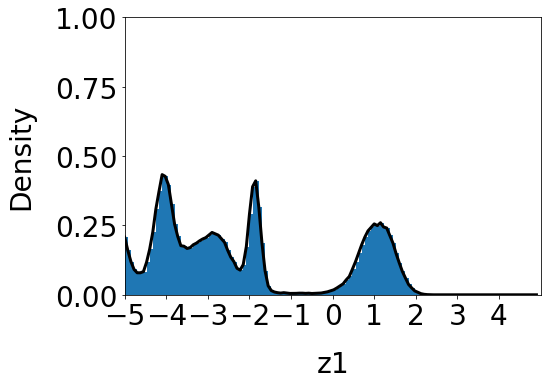

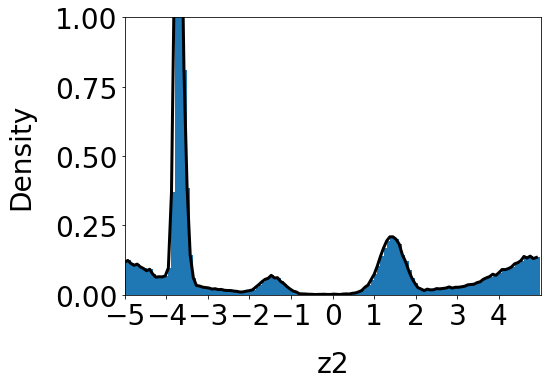

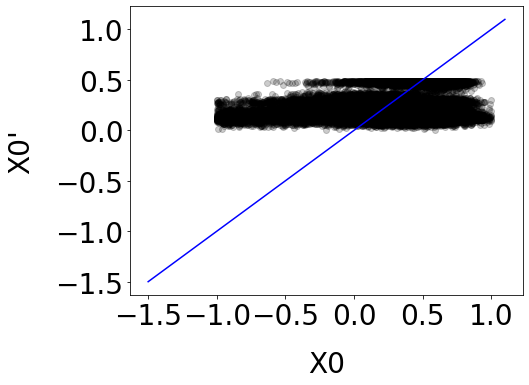

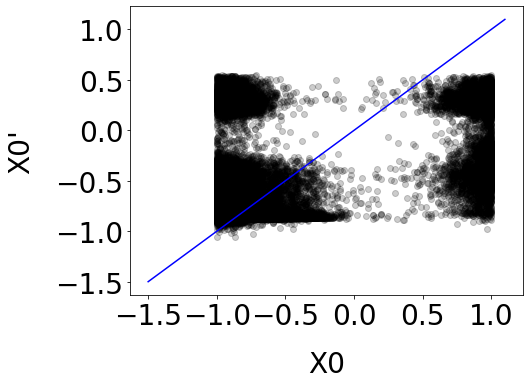

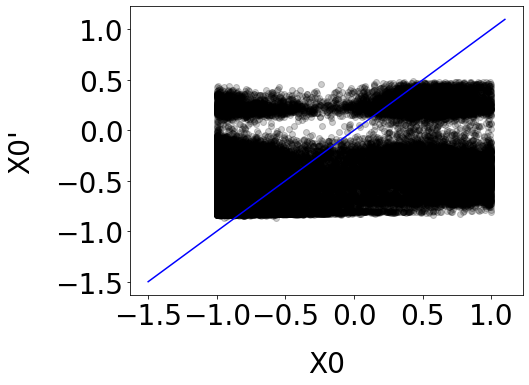

...

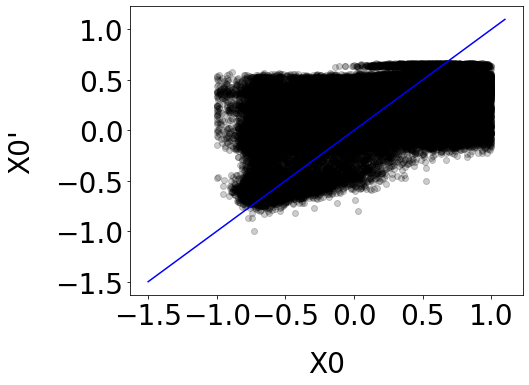

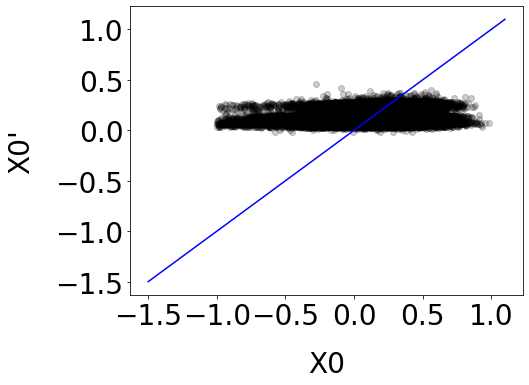

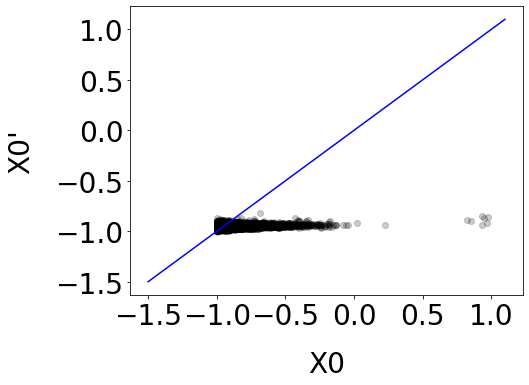

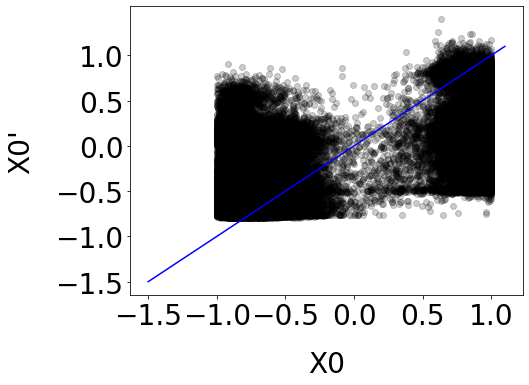

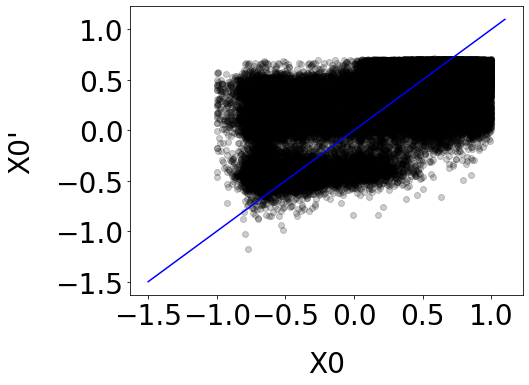

In [273]:
illustrate_and_reconstruct(model,mostsimdata,results_dir)

## Reconstructions

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:15:11.135328: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:15:11.135384: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:15:13.107113: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:15:13.107168: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
/home/wright/anaconda3/envs/tensorflow1-env/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


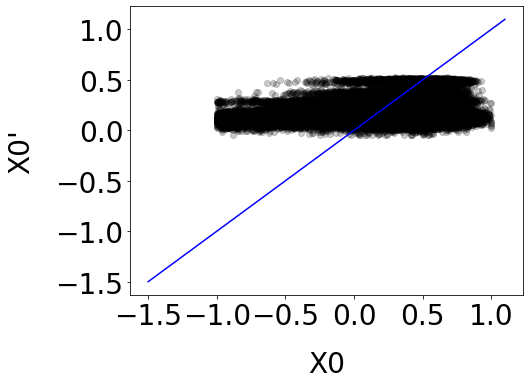

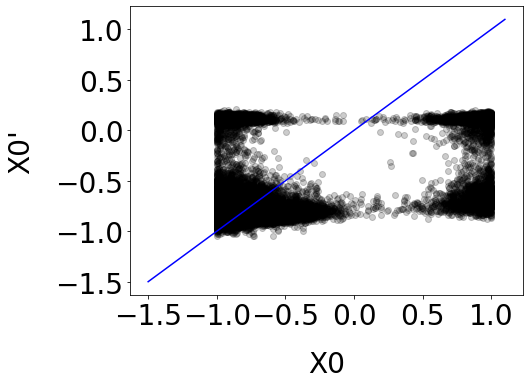

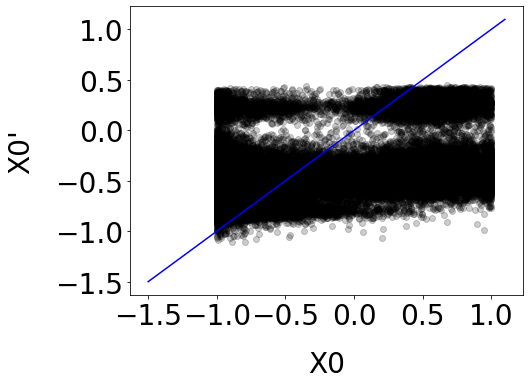

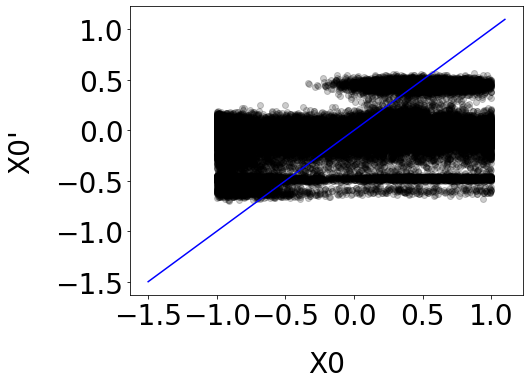

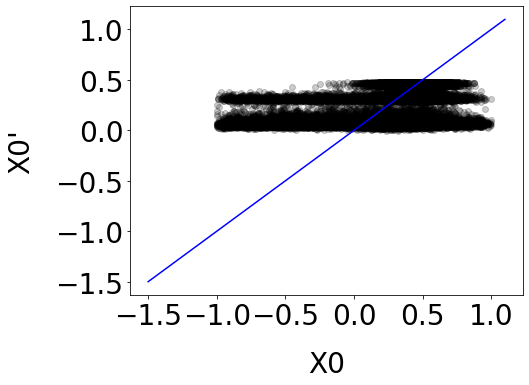

...

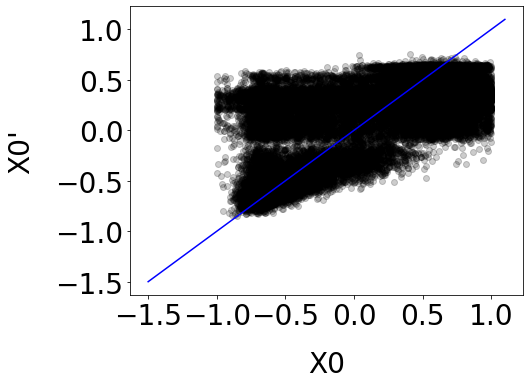

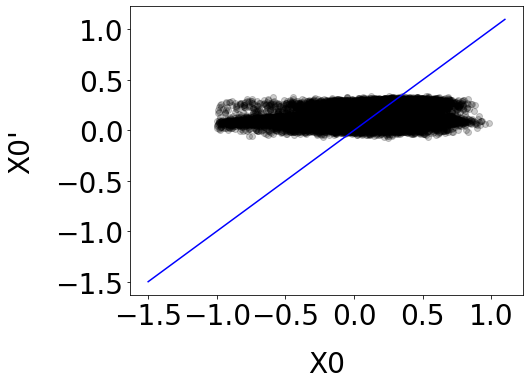

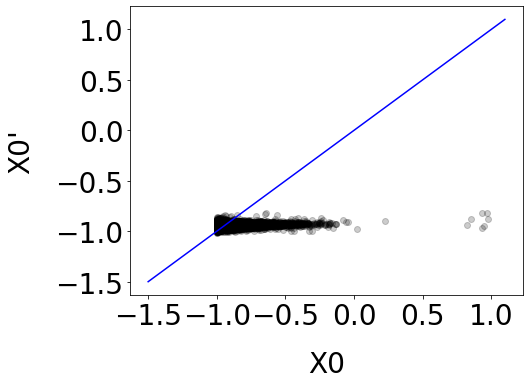

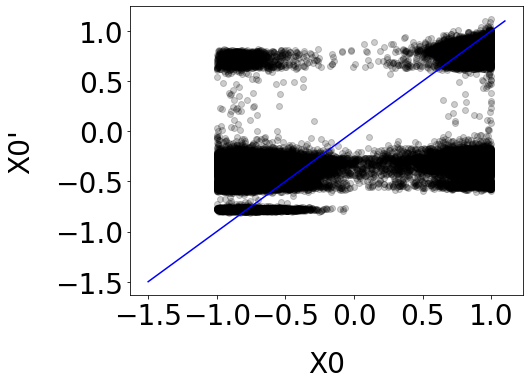

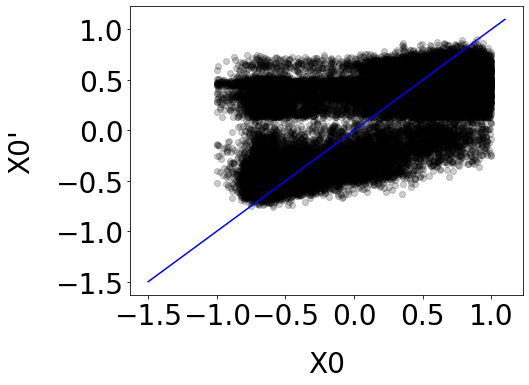

The reconstructions look truly awful. Is this expected behavior for the more complex potentials? Because that's a DEFINITE problem...or is this the old VAE issue due to sampling from Gaussians...?  Or is this simply a more pathological example?  Hm...might be worth running their analysis on alanine dipeptide to figure that out! Because they only give us the reconstructions for the simpler potentials and I'm wondering if it's a cos/sin or distribution effect or something different.

## FESs

Take a look at the free energy surfaces, color with GMVAE-assigned clusters and also system labeled clusters.

In [184]:
np.unique(indices//dsize)
len(indices)

350007

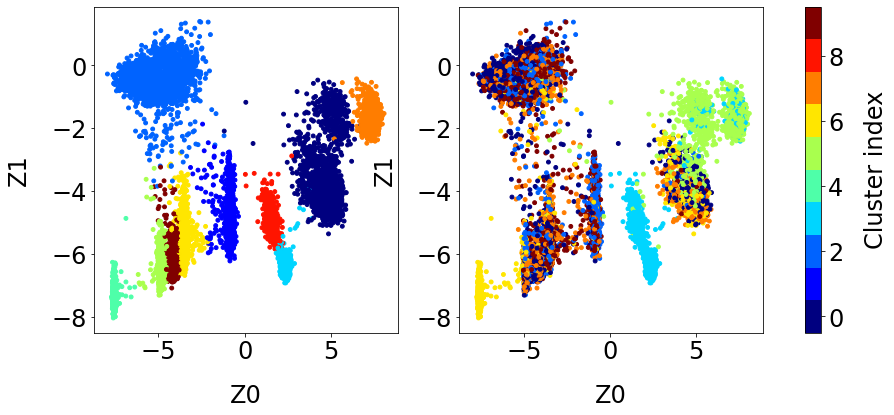

In [187]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))
i=0
step=20
sc = axes[0].scatter(z[::step,0], z[::step,1], c=y_pred[::step], alpha=1, 
                  cmap=plt.cm.get_cmap('jet', len(np.unique(y_pred))), s=15)
cbar = fig.colorbar(sc, ax=axes)
cbar.set_alpha(1)
#cbar.set_ticks(np.arange(0, 5, 1))
cbar.set_label('Cluster index', labelpad=20)
sc.set_alpha(1)
sc.set_clim(-0.5, len(np.unique(y_pred)) - 0.5)
cbar.draw_all()

axes[0].set_xlabel('Z0', labelpad=20)
axes[0].set_ylabel('Z1', labelpad=20)
#axes.set_yticks(np.arange(-0.5,2.1,0.5))
#axes.set_xticks(np.arange(-1.5,1.5,0.5))

sc2 = axes[1].scatter(z[::step,0], z[::step,1], c=(mostindices//dsize)[::step], alpha=1, 
                  cmap=plt.cm.get_cmap('jet', len(np.unique(y_pred))), s=15)
#cbar = fig.colorbar(sc, ax=axes)
#cbar.set_alpha(1)
#cbar.set_ticks(np.arange(0, 5, 1))
#cbar.set_label('System index', labelpad=20)
sc2.set_alpha(1)
sc2.set_clim(-0.5, len(np.unique(mostindices//dsize)) - 0.5)
cbar.draw_all()

axes[1].set_xlabel('Z0', labelpad=20)
axes[1].set_ylabel('Z1', labelpad=20)
#axes.set_yticks(np.arange(-0.5,2.1,0.5))
#axes.set_xticks(np.arange(-1.5,1.5,0.5))

#axes.text(-0.6, 1.5, '0', fontsize=28, verticalalignment='top', color='black', bbox=dict(facecolor='wheat', boxstyle='round', alpha=0.4))
#axes.text(-0.2, 0.5, '1', fontsize=28, verticalalignment='top', color='black', bbox=dict(facecolor='wheat', boxstyle='round', alpha=0.4))
#axes.text(0.5, 0.12, '2', fontsize=28, verticalalignment='top', color='black', bbox=dict(facecolor='wheat', boxstyle='round', alpha=0.4))
fig.savefig(str(results_dir) + '/GL13K_GMVAE_clusters.png', bbox_inches='tight')

In [196]:
simdirs[5]

'GL13KA7analysed'

Assuming nothing was done incorrectly (a rather big assumption-indices holding should be double-checked),it looks like there is some correlation between basin and bin. Like some things might only be populated by certain simulations.

Possible next steps here: look at MSMs for trajectories in this space separately, look at FESs separately.
Thought: check alanine dipeptide versus something similar?

(<Figure size 432x288 with 2 Axes>, <AxesSubplot:>)

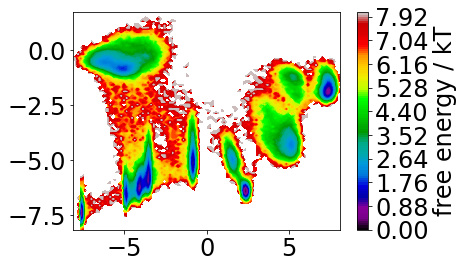

In [197]:
pyemma.plots.plot_free_energy(z[:,0],z[:,1])

In [198]:
dsize = 50001
trajdatas = []
for d in range(len(datas)):
    trajdata = np.zeros((dsize,48))
    datatrim = datas[d][0:dsize,:]
    for col in range(datatrim.shape[1]):
        trajdata[:,2*col] = np.cos(datatrim[:,col])
        trajdata[:,2*col+1] = np.sin(datatrim[:,col])
    trajdatas.append(trajdata)

In [199]:
trajencodings = []
y_preds = []
for trajdata in trajdatas:
    qy = model.encode_y(trajdata)
    y_pred = np.argmax(qy, axis=1)
    z = model.encode_z(trajdata)
    trajencodings.append(z)
    y_preds.append(y_pred)

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:48.147543: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:48.147611: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:48.575815: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:48.575872: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:49.967812: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:49.967869: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:50.393060: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:50.393117: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:50.829104: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:50.829160: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:52.281050: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:52.281119: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:52.744704: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:52.744766: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:53.198630: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:53.198685: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:54.776442: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:54.776503: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:55.287939: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:55.287995: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:55.768816: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:55.768873: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:57.367387: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:57.367445: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:57.856607: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:57.856663: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:58.352588: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:58.352644: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:19:59.997526: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:19:59.997588: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:20:00.518138: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:20:00.518194: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:20:01.050578: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:20:01.050640: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:20:02.924329: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:20:02.924385: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:20:03.475592: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:20:03.475647: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:20:04.022910: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:20:04.022966: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:20:05.890097: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:20:05.890153: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


0 0
1 0
0 1
1 1
0 2
1 2
0 3


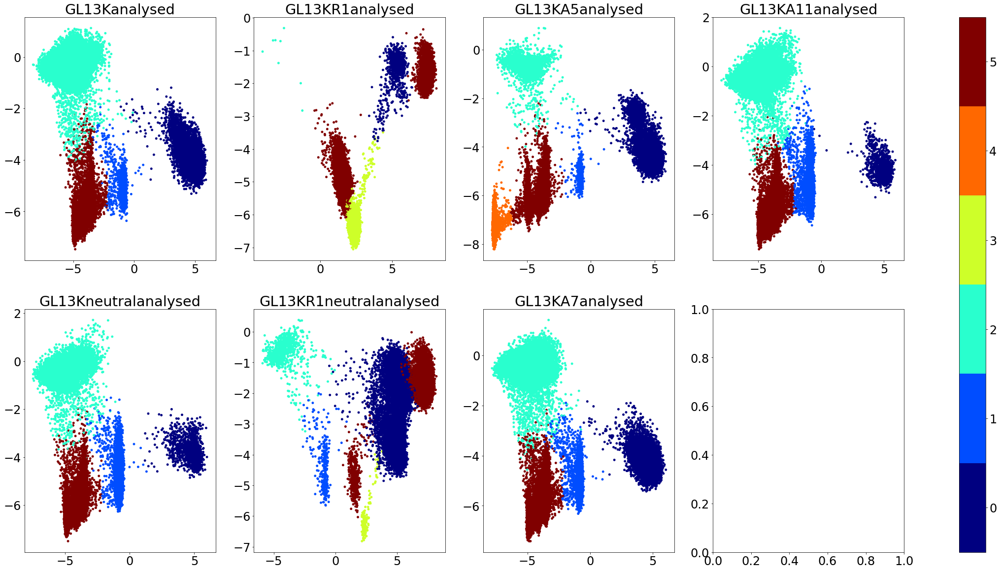

In [200]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(40,20))
for i in range(len(trajencodings)):
    z = trajencodings[i]
    step=1
    sc = axes[i%2,i//2].scatter(z[::step,0], z[::step,1], c=y_preds[i][::step], alpha=1, 
                      cmap=plt.cm.get_cmap('jet', len(np.unique(y_pred))), s=15)

    #cbar.set_ticks(np.arange(0, 5, 1))
    cbar.set_label('Cluster index', labelpad=20)
    sc.set_alpha(1)
    sc.set_clim(-0.5, len(np.unique(y_pred)) - 0.5)
    cbar.draw_all()
    print(i%2,i//2)
    #axes[i//2,i%4].set_xlabel('Z0', labelpad=20)
    #axes[i//2,i%4].set_ylabel('Z1', labelpad=20)
    axes[i%2,i//2].set_title(simdirs[i])
    #axes.set_yticks(np.arange(-0.5,2.1,0.5))
    #axes.set_xticks(np.arange(-1.5,1.5,0.5))
cbar = fig.colorbar(sc, ax=axes)
cbar.set_alpha(1)

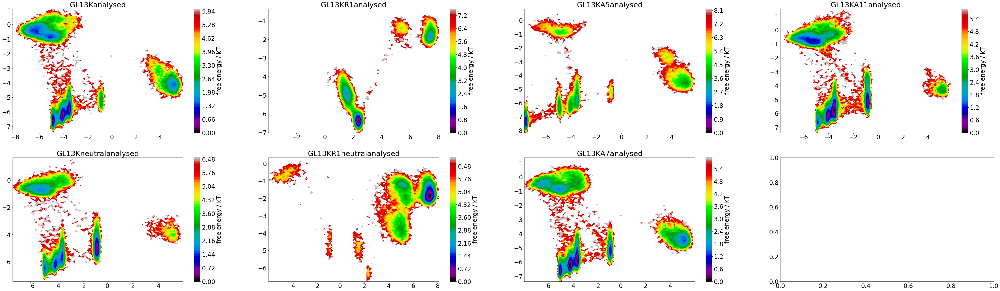

In [201]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(70,20))
for i in range(len(trajencodings)):
    z = trajencodings[i]
    pyemma.plots.plot_free_energy(z[:,0],z[:,1],ax=axes[i%2,i//2])
    axes[i%2,i//2].set_title(simdirs[i])

I strongly suspect they should NOT look this identical...but I'm not sure where I've gone wrong...Check with bog-standard PCA, maybe? and TICA? UPDATE: fixed the identicalness, but let's still compare with PCA & TICA.

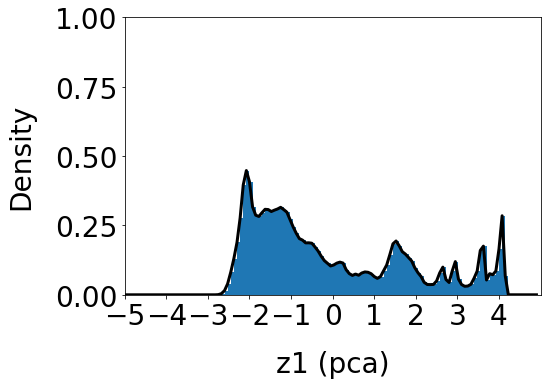

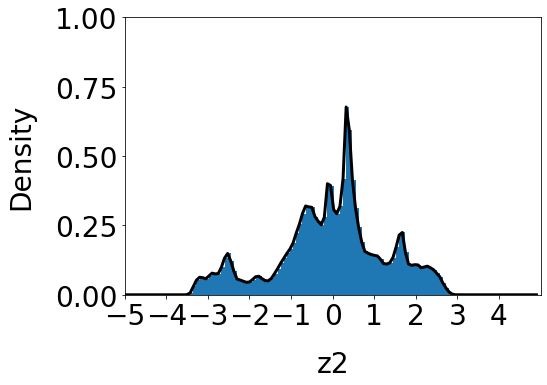

In [202]:
pca = pyemma.coordinates.pca(data=mostsimdata,dim=2)
zpca = pca.fit_transform(mostsimdata)
matplotlib.rcParams.update({'font.size': 28})
plt.figure(figsize=(8,6))
_ = plt.hist(zpca[:,0], bins= np.arange(-5, 5, 0.075), density=True)
ah = np.histogram(zpca[:,0], bins= np.arange(-5, 5, 0.075), density=True)
plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
plt.ylabel('Density', labelpad=20)
plt.xlabel('z1 (pca)', labelpad=20)
plt.xticks(np.arange(-5, 5))
plt.xlim([-5,5])
plt.ylim([0, 1])
titlename = 'z1_histograms_line_pca'
plt.tight_layout()
plt.savefig(str(results_dir) + '/z1_histogram_pca.png', bbox_inches='tight')

matplotlib.rcParams.update({'font.size': 28})
plt.figure(figsize=(8,6))
_ = plt.hist(zpca[:,1], bins= np.arange(-5, 5, 0.075), density=True)
ah = np.histogram(zpca[:,1], bins= np.arange(-5, 5, 0.075), density=True)
plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
plt.ylabel('Density', labelpad=20)
plt.xlabel('z2', labelpad=20)
plt.xticks(np.arange(-5, 5))
plt.xlim([-5,5])
plt.ylim([0, 1])
titlename = 'z2_histograms_line_pca'
plt.tight_layout()
plt.savefig(str(results_dir) + '/z2_histogram_pca.png', bbox_inches='tight')

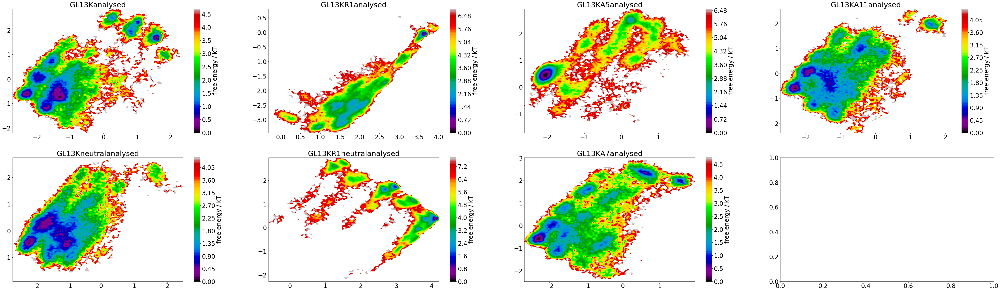

In [203]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(70,20))
for i in range(len(trajencodings)):
    zpca = pca.transform(trajdatas[i])
    pyemma.plots.plot_free_energy(zpca[:,0],zpca[:,1],ax=axes[i%2,i//2])
    axes[i%2,i//2].set_title(simdirs[i])

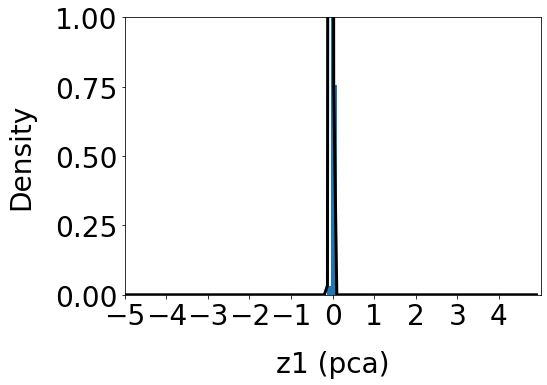

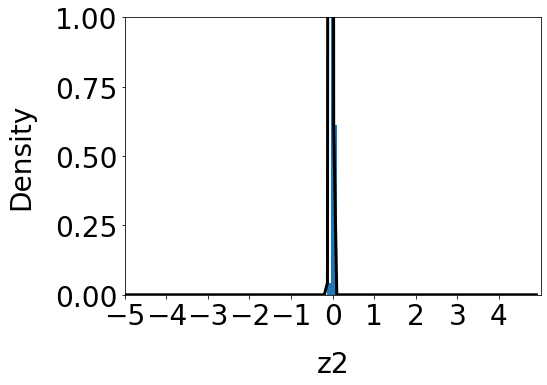

In [205]:
tica = pyemma.coordinates.tica(data=mostsimdata,dim=2)
ztica = pca.fit_transform(mostsimdata)
matplotlib.rcParams.update({'font.size': 28})
plt.figure(figsize=(8,6))
_ = plt.hist(ztica[:,0], bins= np.arange(-5, 5, 0.075), density=True)
ah = np.histogram(ztica[:,0], bins= np.arange(-5, 5, 0.075), density=True)
plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
plt.ylabel('Density', labelpad=20)
plt.xlabel('z1 (pca)', labelpad=20)
plt.xticks(np.arange(-5, 5))
plt.xlim([-5,5])
plt.ylim([0, 1])
titlename = 'z1_histograms_line_pca'
plt.tight_layout()
plt.savefig(str(results_dir) + '/z1_histogram_pca.png', bbox_inches='tight')

matplotlib.rcParams.update({'font.size': 28})
plt.figure(figsize=(8,6))
_ = plt.hist(ztica[:,1], bins= np.arange(-5, 5, 0.075), density=True)
ah = np.histogram(ztica[:,1], bins= np.arange(-5, 5, 0.075), density=True)
plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
plt.ylabel('Density', labelpad=20)
plt.xlabel('z2', labelpad=20)
plt.xticks(np.arange(-5, 5))
plt.xlim([-5,5])
plt.ylim([0, 1])
titlename = 'z2_histograms_line_pca'
plt.tight_layout()
plt.savefig(str(results_dir) + '/z2_histogram_pca.png', bbox_inches='tight')

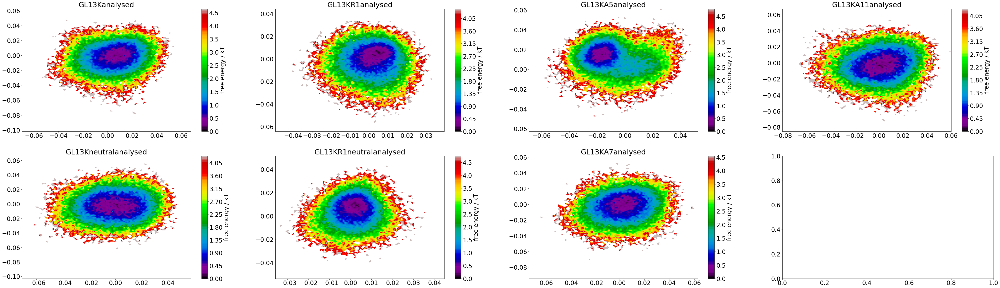

In [206]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(70,20))
for i in range(len(trajencodings)):
    ztica = tica.transform(trajdatas[i])
    pyemma.plots.plot_free_energy(ztica[:,0],ztica[:,1],ax=axes[i%2,i//2])
    axes[i%2,i//2].set_title(simdirs[i])

TICA looks terrible, which makes sense, because it relies on the time assumption, which neither PCA nor the GMVAE do and therefore mucking up the trajectories means we've just done something rather nonsensical.  But that's a good sanity check, anyway. DMAP would also work, but I think sticking to something VAE-ish makes more sense, at least.

If we compare with $k=1$ we're essentially comparing to a bog-standard VAE so maybe throw that in there as well.  Also what about fractional variance explained for dimensionality?

In [207]:
k, n_x, n_z, n_epochs = 1, 48, 2, 301
qy_dims = [16,16]
qz_dims = [16,16]
pz_dims = [16,16]
px_dims = [16,16]
r_nent = 0.3
batch_size = 10000
lr = 0.001

model_path = modeldir + 'GL13Kmodel_' +str(k)+'_'+str(n_z)+'_'+str(n_epochs)+'_'+str(r_nent)+'_' + str(batch_size)
results = '_results'

if not os.path.exists(model_path):
    os.makedirs(model_path)

results_dir_s = model_path+results

if not os.path.exists(results_dir_s):
    os.makedirs(results_dir_s)
    
results_dir = Path(results_dir_s)
    
model = GMVAE(model_path, k=k, n_x=n_x, n_z=n_z, qy_dims = qy_dims,
              qz_dims = qz_dims, pz_dims = pz_dims, px_dims = px_dims,
              r_nent = r_nent, batch_size=batch_size, lr=lr)
saver = tf.train.Saver()

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    history, ye, ze = model.train(dataset, sess, epochs=n_epochs,
                                  n_train_eval=200000, n_test_eval=200000, save_parameters=True, 
                                  is_labeled=False, track_losses=True, verbose=True)
    
f = open(model_path + '/training_params.txt','w+')
f.write(f'k={k}, n_x={n_x}, n_z={n_z}, n_epochs={n_epochs}, qy_dims={qy_dims}, qz_dims={qz_dims}, '+
        f'pz_dims={pz_dims}, px_dims={px_dims}, r_ent={r_nent}, batch_size={batch_size}, lr={lr}')
raw_data = {'k': [k], 'n_x': [n_x], 'n_z': [n_z], 'n_epochs': [n_epochs], 'qy_dims': [qy_dims], 'qz_dims': [qz_dims], 'pz_dims': [pz_dims], 
            'px_dims': [px_dims], 'r_nent': [r_nent], 'batch_size': [batch_size], 'lr': [lr]}
df = pd.DataFrame(data=raw_data)
df.to_pickle(model_path + '/training_params.pkl')
f.close()

graph written


2022-03-02 14:28:03.892880: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:28:03.892940: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.26e+01, -0.00e+00,  5.12e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.68e+01, -0.00e+00,  1.63e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.25e+01, -0.00e+00,  1.24e+01,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

In [229]:
qy = model.encode_y(mostsimdata)
y_pred = np.argmax(qy, axis=1)
z = model.encode_z(mostsimdata)

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:53:55.670614: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:53:55.670676: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:53:55.933949: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:53:55.934005: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:53:56.214846: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:53:56.214902: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


In [231]:
z.shape

(315007, 2)

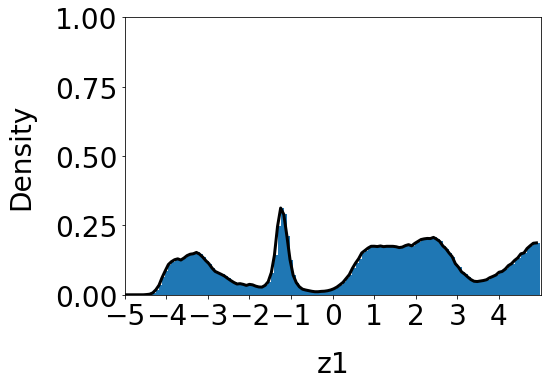

In [214]:
matplotlib.rcParams.update({'font.size': 28})
plt.figure(figsize=(8,6))
_ = plt.hist(z[:,0], bins= np.arange(-5, 5, 0.075), density=True)
ah = np.histogram(z[:,0], bins= np.arange(-5, 5, 0.075), density=True)
plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
plt.ylabel('Density', labelpad=20)
plt.xlabel('z1', labelpad=20)
plt.xticks(np.arange(-5, 5))
plt.xlim([-5,5])
plt.ylim([0, 1])
titlename = 'z1_histograms_line'
plt.tight_layout()
plt.savefig(str(results_dir) + '/z1_histogram.png', bbox_inches='tight')

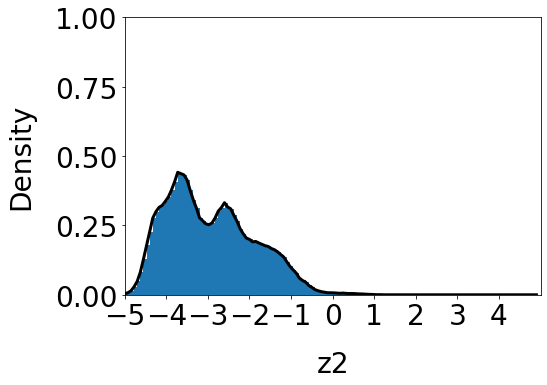

In [215]:
matplotlib.rcParams.update({'font.size': 28})
plt.figure(figsize=(8,6))
_ = plt.hist(z[:,1], bins= np.arange(-5, 5, 0.075), density=True)
ah = np.histogram(z[:,1], bins= np.arange(-5, 5, 0.075), density=True)
plt.plot(ah[1][:-1], ah[0], linewidth=3, color='k')
plt.ylabel('Density', labelpad=20)
plt.xlabel('z2', labelpad=20)
plt.xticks(np.arange(-5, 5))
plt.xlim([-5,5])
plt.ylim([0, 1])
titlename = 'z2_histograms_line'
plt.tight_layout()
plt.savefig(str(results_dir) + '/z2_histogram.png', bbox_inches='tight')

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:49:14.820463: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:49:14.820527: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:49:15.122420: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:49:15.122475: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      
/home/wright/anaconda3/envs/tensorflow1-env/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


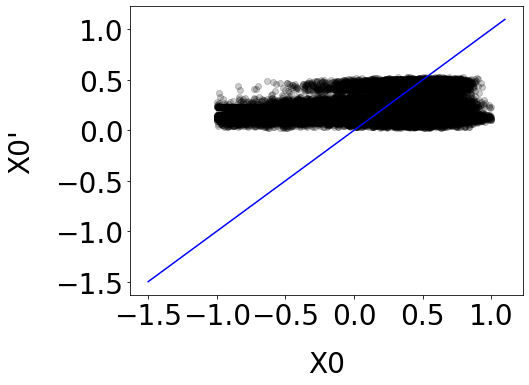

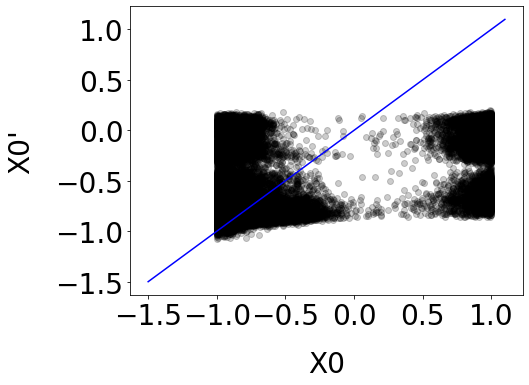

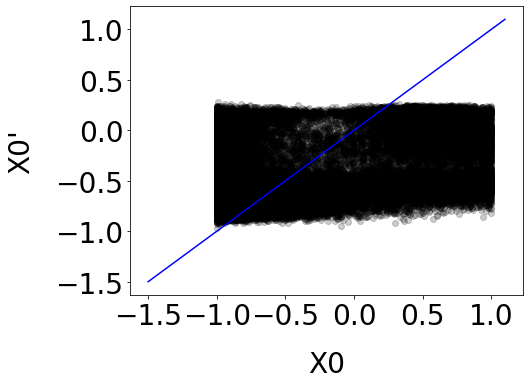

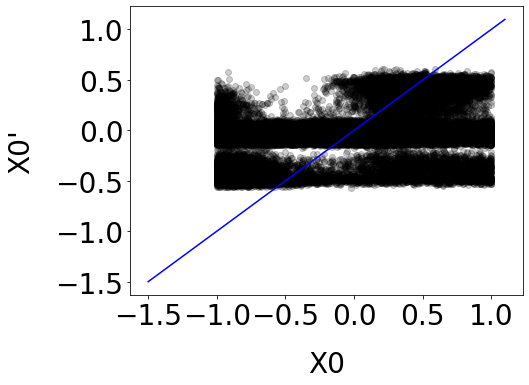

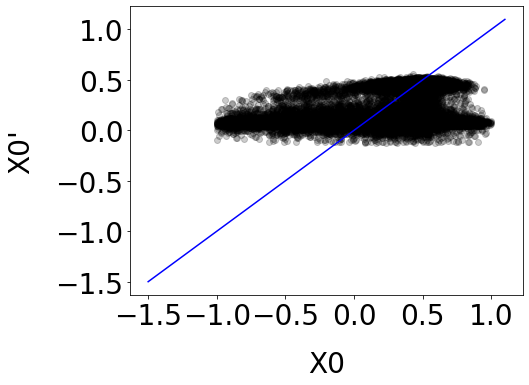

...

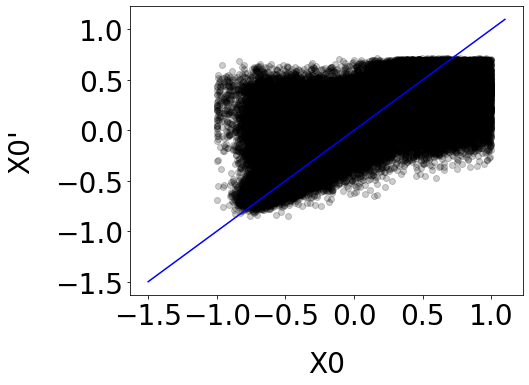

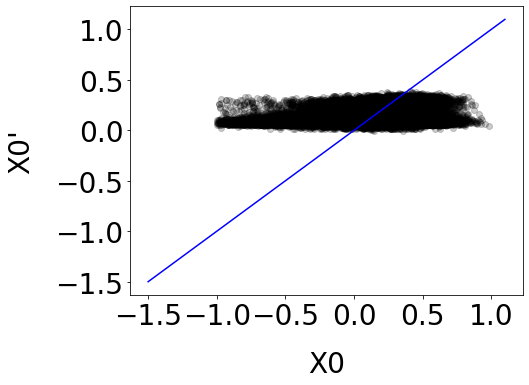

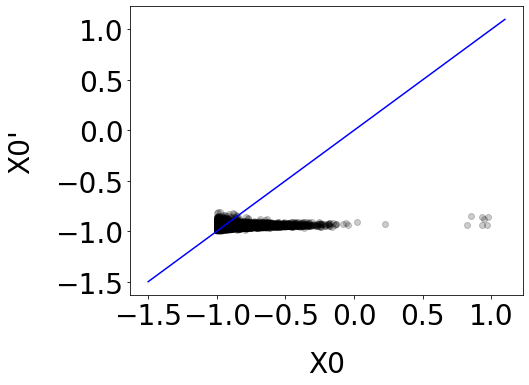

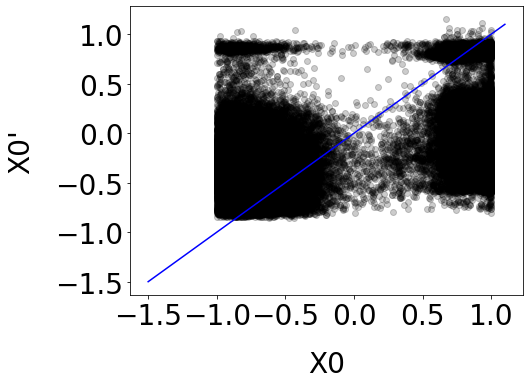

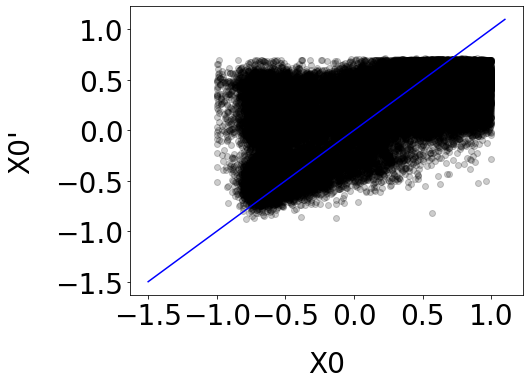

In [216]:
matplotlib.rcParams.update({'font.size': 28})
x = model.reconstruct(mostsimdata)
for i in range(mostsimdata.shape[1]):
    plt.figure(figsize=(8,6))

    plt.scatter(mostsimdata[::5,i], x[::5,i], color = 'k', alpha=0.2)
    plt.xlabel("X0", labelpad=20)
    plt.ylabel("X0'", labelpad=20)
    lims = [-1.5, 1.1]
    plt.plot(lims, lims, 'b-', alpha=1)
    plt.xticks(np.arange(-1.5, 1.1, step=0.5))
    plt.yticks(np.arange(-1.5, 1.1, step=0.5))
    plt.tight_layout()
    plt.savefig(str(results_dir) + '/reconst_X{}.png'.format(i))

In [223]:
len(y_pred[::step])

15751

In [234]:
mostindices//dsize

array([6, 0, 1, ..., 5, 0, 5])

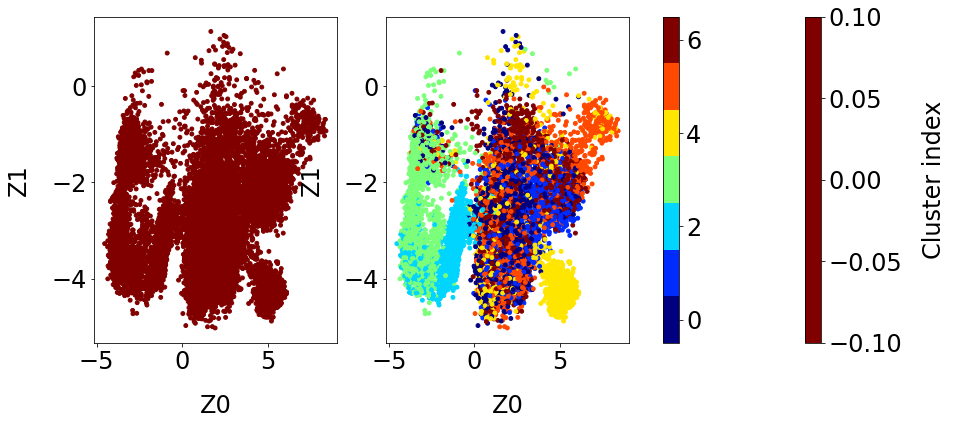

In [240]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))
i=0
step=20
sc = axes[0].scatter(z[::step,0], z[::step,1], c=y_pred[::step], alpha=1, 
                  cmap=plt.cm.get_cmap('jet', len(np.unique(y_pred))), s=15)
cbar = fig.colorbar(sc, ax=axes)
cbar.set_alpha(1)
#cbar.set_ticks(np.arange(0, 5, 1))
cbar.set_label('Cluster index', labelpad=20)
sc.set_alpha(1)
#sc.set_clim(-0.5, len(np.unique(y_pred)) - 0.5)
#cbar.draw_all()

axes[0].set_xlabel('Z0', labelpad=20)
axes[0].set_ylabel('Z1', labelpad=20)
#axes.set_yticks(np.arange(-0.5,2.1,0.5))
#axes.set_xticks(np.arange(-1.5,1.5,0.5))

sc2 = axes[1].scatter(z[::step,0], z[::step,1], c=(mostindices//dsize)[::step], alpha=1, 
                  cmap=plt.cm.get_cmap('jet', len(np.unique(mostindices//dsize))), s=15)
cbar = fig.colorbar(sc2, ax=axes)
#cbar.set_alpha(1)
#cbar.set_ticks(np.arange(0, 5, 1))
#cbar.set_label('System index', labelpad=20)
sc2.set_alpha(1)
sc2.set_clim(-0.5, len(np.unique(mostindices//dsize)) - 0.5)
cbar.draw_all()

axes[1].set_xlabel('Z0', labelpad=20)
axes[1].set_ylabel('Z1', labelpad=20)
#axes.set_yticks(np.arange(-0.5,2.1,0.5))
#axes.set_xticks(np.arange(-1.5,1.5,0.5))

#axes.text(-0.6, 1.5, '0', fontsize=28, verticalalignment='top', color='black', bbox=dict(facecolor='wheat', boxstyle='round', alpha=0.4))
#axes.text(-0.2, 0.5, '1', fontsize=28, verticalalignment='top', color='black', bbox=dict(facecolor='wheat', boxstyle='round', alpha=0.4))
#axes.text(0.5, 0.12, '2', fontsize=28, verticalalignment='top', color='black', bbox=dict(facecolor='wheat', boxstyle='round', alpha=0.4))
fig.savefig(str(results_dir) + '/GL13K_GMVAE_clusters.png', bbox_inches='tight')

In [242]:
trajencodings = []
y_preds = []
for trajdata in trajdatas:
    qy = model.encode_y(trajdata)
    y_pred = np.argmax(qy, axis=1)
    z = model.encode_z(trajdata)
    trajencodings.append(z)
    y_preds.append(y_pred)

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:49.424113: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:49.424179: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:49.673968: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:49.674023: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:49.921218: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:49.921289: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:50.178416: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:50.178476: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:50.437389: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:50.437458: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:50.733511: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:50.733571: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:51.026907: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:51.026965: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:51.314249: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:51.314307: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:51.618569: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:51.618627: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:51.917458: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:51.917513: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:52.235115: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:52.235176: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:52.555856: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:52.555939: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:52.876275: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:52.876328: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:53.185510: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:53.185575: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:53.523010: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:53.523074: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:53.848420: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:53.848478: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:54.187150: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:54.187206: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:54.538540: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:54.538599: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:54.882360: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:54.882416: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:55.255518: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:55.255582: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 14:57:55.624427: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 14:57:55.624486: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


0 0
1 0
0 1
1 1
0 2
1 2
0 3


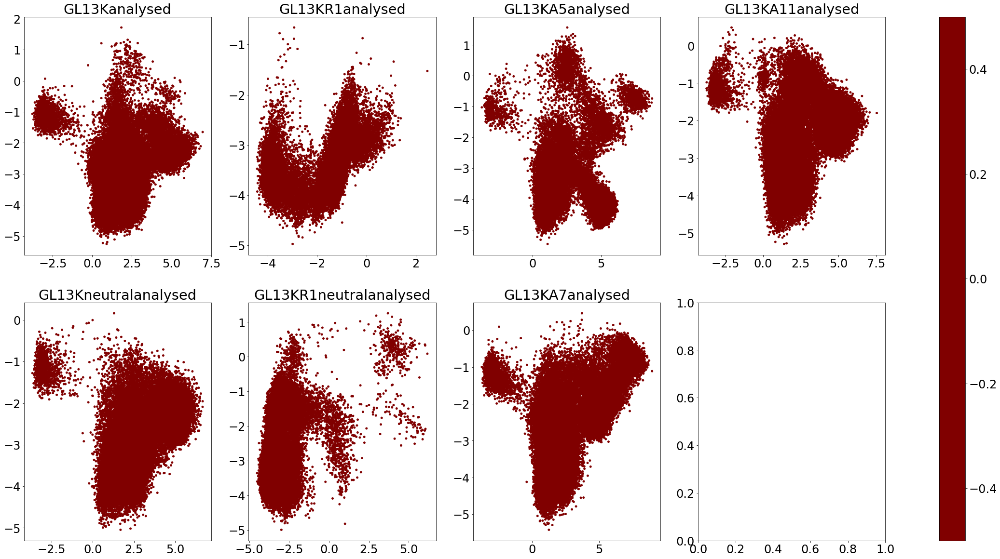

In [243]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(40,20))
for i in range(len(trajencodings)):
    z = trajencodings[i]
    step=1
    sc = axes[i%2,i//2].scatter(z[::step,0], z[::step,1], c=y_preds[i][::step], alpha=1, 
                      cmap=plt.cm.get_cmap('jet', len(np.unique(y_pred))), s=15)

    #cbar.set_ticks(np.arange(0, 5, 1))
    cbar.set_label('Cluster index', labelpad=20)
    sc.set_alpha(1)
    sc.set_clim(-0.5, len(np.unique(y_pred)) - 0.5)
    cbar.draw_all()
    print(i%2,i//2)
    #axes[i//2,i%4].set_xlabel('Z0', labelpad=20)
    #axes[i//2,i%4].set_ylabel('Z1', labelpad=20)
    axes[i%2,i//2].set_title(simdirs[i])
    #axes.set_yticks(np.arange(-0.5,2.1,0.5))
    #axes.set_xticks(np.arange(-1.5,1.5,0.5))
cbar = fig.colorbar(sc, ax=axes)
cbar.set_alpha(1)

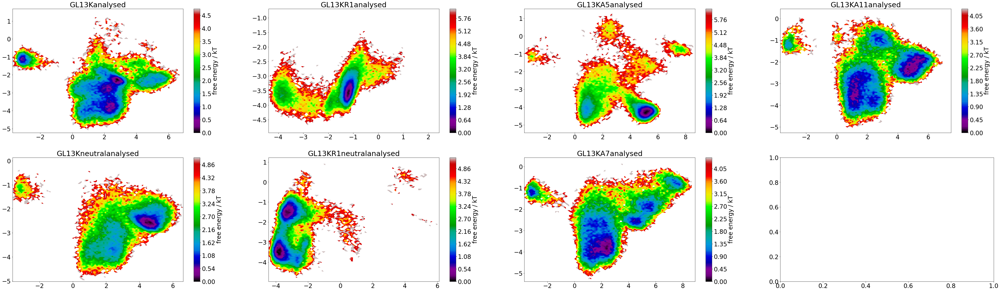

In [244]:
matplotlib.rcParams.update({'font.size': 24})
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(70,20))
for i in range(len(trajencodings)):
    z = trajencodings[i]
    pyemma.plots.plot_free_energy(z[:,0],z[:,1],ax=axes[i%2,i//2])
    axes[i%2,i//2].set_title(simdirs[i])

In [260]:
np.dot(mostsimdata[0,:],mostsimdata[0,:])

23.999999812762216

In [262]:
frac_var_explained(mostsimdata,model.reconstruct(mostsimdata))

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:13:51.933268: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:13:51.935764: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 15:13:54.597381: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:13:54.597437: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


0.4034819153688497

In [274]:
150/60

2.5

The model here takes about fifteen minutes to run.  Let's try it with varying values of the latent space dimension and check how that affects the FVE, let's also do this for $k=1$ and $k=10$ for comparison. So trying latent space dimensions of $1,2,3,5,10$ should be 10 training runs of about 15 minutes, which is 150 minutes or about 2-3 hours...although it might take a lot longer for higher nzs actually.  So let's keep track of the timing. Also for heavens' sake remember that you can LOAD A MODEL YOU HAVE ALREADY TRAINED.

Starting model with latent dimension 10, Gaussian cluster centers 10
graph written


2022-03-02 15:56:26.504256: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 15:56:26.504312: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  2.24e+00,  5.43e+01,  2.28e+00,  5.29e+01,         1
Sample of qy
0.09 0.09 0.08 0.12 0.13 0.09 0.08 0.09 0.12 0.10 
0.09 0.07 0.14 0.10 0.12 0.09 0.09 0.08 0.09 0.13 
0.11 0.10 0.09 0.11 0.12 0.09 0.10 0.09 0.09 0.09 
0.10 0.10 0.11 0.10 0.10 0.10 0.10 0.10 0.11 0.10 
0.12 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  7.46e-02,  1.08e+01,  7.77e-02,  1.05e+01,        51
Sample of qy
1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 1.00 0.00 
0.01 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.99 
0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 

epoch:        100                                

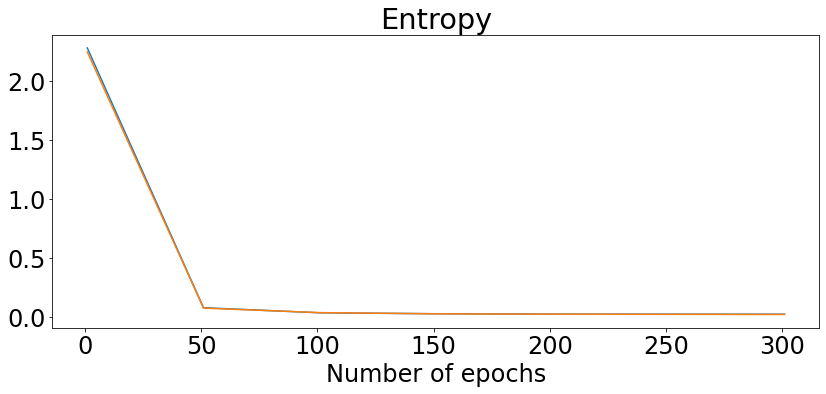

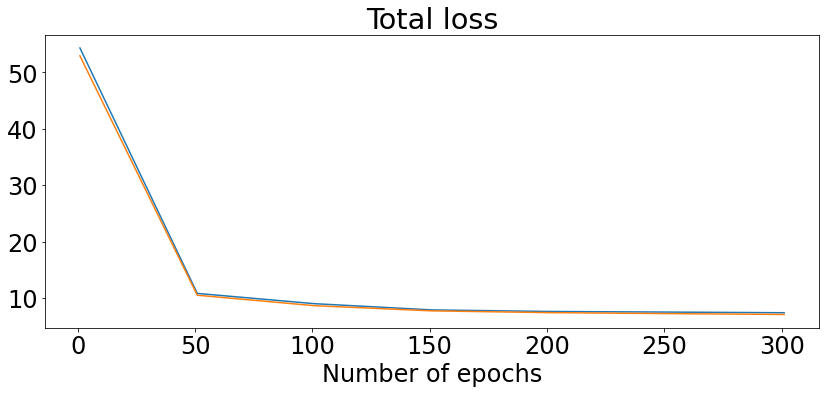

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_10_301_0.3_10000/model.ckpt-301


2022-03-02 16:15:36.278178: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:15:36.278238: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_10_301_0.3_10000/model.ckpt-301


2022-03-02 16:15:36.774501: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:15:36.774566: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_10_301_0.3_10000/model.ckpt-301


2022-03-02 16:15:38.644310: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:15:38.644364: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_10_301_0.3_10000/model.ckpt-301


2022-03-02 16:15:39.498528: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:15:39.498584: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_10_301_0.3_10000/model.ckpt-301


2022-03-02 16:15:41.573833: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:15:41.573897: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


8 clusters found out of 10 allowed
FVE of model: 0.39984558677191484
Finished training in 1162.3461608886719
Starting model with latent dimension 5, Gaussian cluster centers 10
graph written


2022-03-02 16:15:48.939221: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:15:48.939275: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  2.21e+00,  5.26e+01,  2.29e+00,  5.26e+01,         1
Sample of qy
0.09 0.08 0.09 0.09 0.11 0.16 0.08 0.12 0.10 0.08 
0.09 0.09 0.09 0.11 0.10 0.12 0.09 0.11 0.10 0.09 
0.09 0.09 0.11 0.10 0.09 0.13 0.09 0.11 0.10 0.09 
0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.11 0.10 
0.08 0.09 0.08 0.09 0.11 0.15 0.08 0.10 0.15 0.08 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  6.14e-02,  9.97e+00,  5.95e-02,  9.72e+00,        51
Sample of qy
0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 0.00 0.00 1.00 0.00 0.00 
0.00 0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 
1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 1.00 

epoch:        100                                

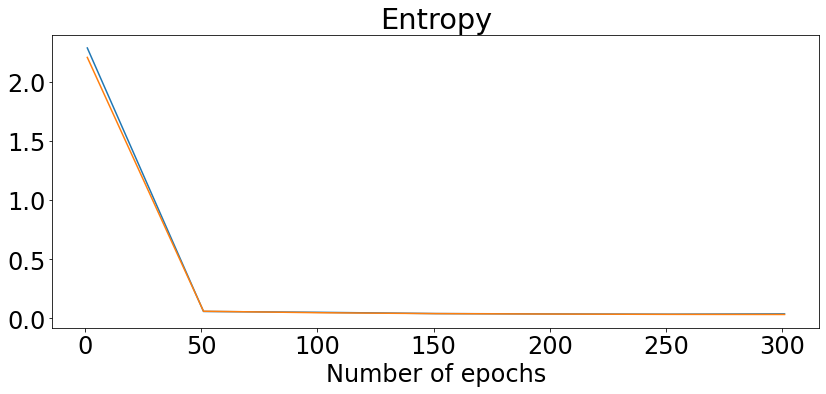

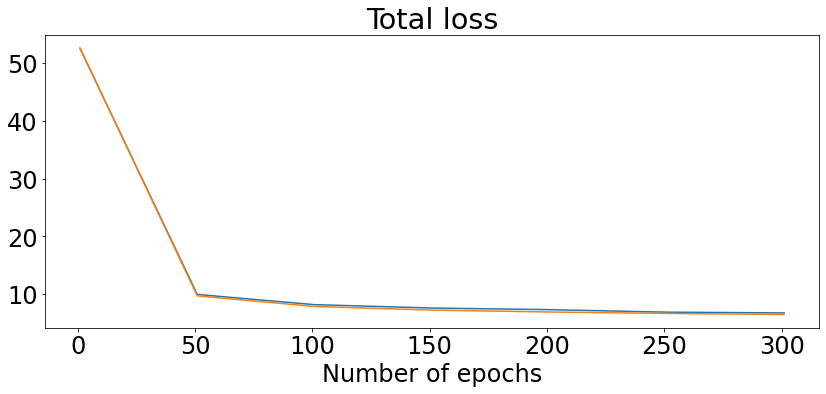

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_5_301_0.3_10000/model.ckpt-301


2022-03-02 16:31:46.325813: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:31:46.325869: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_5_301_0.3_10000/model.ckpt-301


2022-03-02 16:31:46.758675: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:31:46.758730: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_5_301_0.3_10000/model.ckpt-301


2022-03-02 16:31:48.506432: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:31:48.506486: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_5_301_0.3_10000/model.ckpt-301


2022-03-02 16:31:49.045783: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:31:49.045840: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_5_301_0.3_10000/model.ckpt-301


2022-03-02 16:31:50.927446: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:31:50.927499: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


9 clusters found out of 10 allowed
FVE of model: 0.41718272094277997
Finished training in 969.3547871112823
Starting model with latent dimension 3, Gaussian cluster centers 10
graph written


2022-03-02 16:31:58.940843: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:31:58.940897: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  2.27e+00,  5.36e+01,  2.30e+00,  5.27e+01,         1
Sample of qy
0.09 0.11 0.09 0.10 0.11 0.09 0.12 0.09 0.09 0.10 
0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 
0.10 0.11 0.10 0.10 0.10 0.10 0.11 0.10 0.10 0.10 
0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 0.10 
0.10 0.13 0.10 0.10 0.10 0.10 0.10 0.10 0.11 0.10 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  9.84e-02,  1.20e+01,  9.55e-02,  1.16e+01,        51
Sample of qy
0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 1.00 0.00 
0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 1.00 0.00 
0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.99 0.00 0.00 0.00 0.00 0.00 0.01 
0.00 0.00 0.66 0.00 0.00 0.34 0.00 0.00 0.00 0.00 

epoch:        100                                

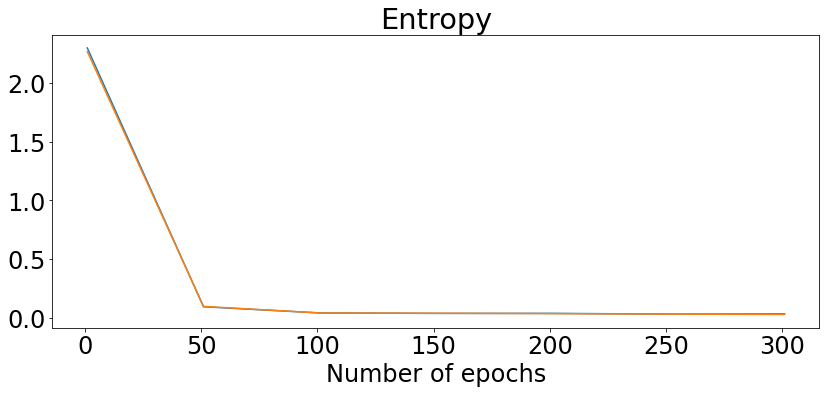

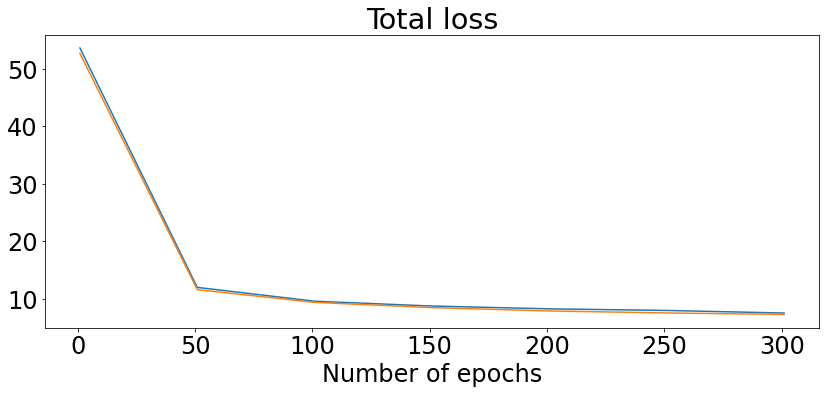

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_3_301_0.3_10000/model.ckpt-301


2022-03-02 16:47:23.461989: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:47:23.462045: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_3_301_0.3_10000/model.ckpt-301


2022-03-02 16:47:23.872509: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:47:23.872566: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_3_301_0.3_10000/model.ckpt-301


2022-03-02 16:47:25.592456: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:47:25.592516: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_3_301_0.3_10000/model.ckpt-301


2022-03-02 16:47:26.081924: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:47:26.081979: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_3_301_0.3_10000/model.ckpt-301


2022-03-02 16:47:28.012602: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:47:28.012662: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


8 clusters found out of 10 allowed
FVE of model: 0.40621297104168397
Finished training in 937.0017852783203
Starting model with latent dimension 2, Gaussian cluster centers 10
graph written


2022-03-02 16:47:35.215459: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 16:47:35.215515: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  2.22e+00,  5.24e+01,  2.29e+00,  5.22e+01,         1
Sample of qy
0.09 0.09 0.09 0.14 0.09 0.09 0.09 0.09 0.10 0.12 
0.09 0.09 0.09 0.12 0.09 0.09 0.09 0.09 0.14 0.11 
0.10 0.11 0.09 0.13 0.09 0.09 0.09 0.09 0.12 0.09 
0.10 0.11 0.10 0.12 0.09 0.10 0.09 0.09 0.10 0.09 
0.09 0.09 0.09 0.14 0.10 0.09 0.09 0.09 0.10 0.10 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  6.87e-02,  1.33e+01,  6.92e-02,  1.30e+01,        51
Sample of qy
0.00 0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 

epoch:        100                                

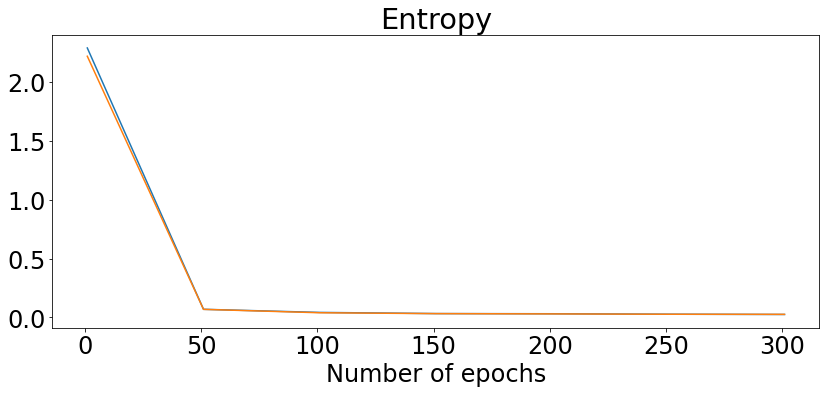

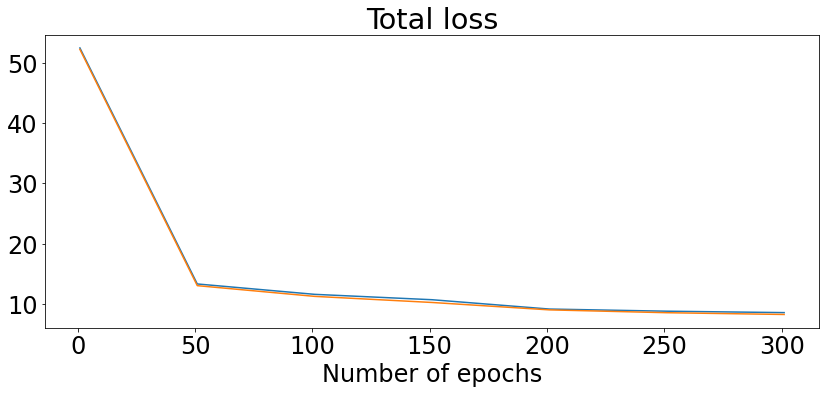

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:02:36.464892: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:02:36.464950: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:02:36.921815: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:02:36.921870: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:02:38.676802: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:02:38.676858: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:02:39.156287: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:02:39.156342: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:02:41.043057: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:02:41.043115: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


7 clusters found out of 10 allowed
FVE of model: 0.4057792592655366
Finished training in 913.0622184276581
Starting model with latent dimension 1, Gaussian cluster centers 10
graph written


2022-03-02 17:02:48.355365: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:02:48.355429: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  2.27e+00,  5.27e+01,  2.30e+00,  5.12e+01,         1
Sample of qy
0.09 0.09 0.12 0.09 0.09 0.11 0.13 0.10 0.09 0.09 
0.09 0.10 0.11 0.09 0.09 0.09 0.11 0.11 0.10 0.09 
0.10 0.10 0.10 0.10 0.10 0.11 0.10 0.10 0.10 0.11 
0.09 0.09 0.09 0.12 0.09 0.09 0.10 0.12 0.10 0.09 
0.10 0.09 0.10 0.11 0.09 0.10 0.11 0.11 0.09 0.10 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
  6.12e-01,  2.18e+01,  6.22e-01,  2.19e+01,        51
Sample of qy
0.00 0.00 0.34 0.00 0.00 0.66 0.00 0.00 0.00 0.00 
0.00 0.00 0.96 0.00 0.00 0.04 0.00 0.00 0.00 0.00 
0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 1.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 
0.00 0.00 0.00 0.00 0.00 1.00 0.00 0.00 0.00 0.00 

epoch:        100                                

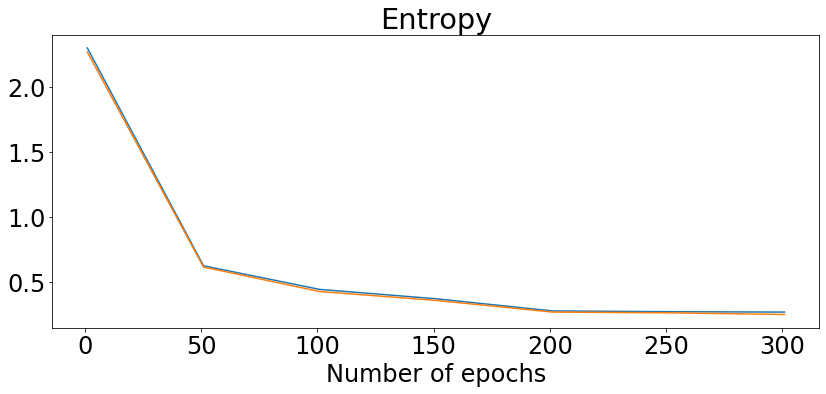

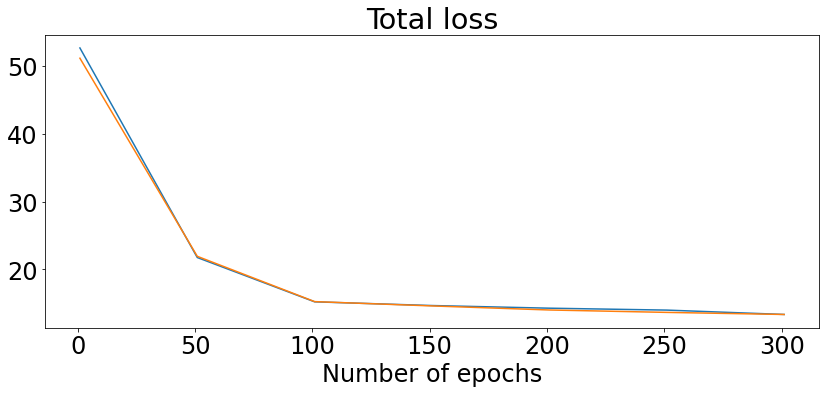

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:17:31.353658: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:17:31.353714: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:17:31.822622: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:17:31.822677: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:17:33.602226: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:17:33.602282: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:17:34.073157: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:17:34.073213: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_10_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:17:35.962586: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:17:35.962639: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


10 clusters found out of 10 allowed
FVE of model: 0.32212911954163814
Finished training in 894.94211602211
Starting model with latent dimension 10, Gaussian cluster centers 1
graph written


2022-03-02 17:17:41.158520: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:17:41.158577: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.29e+01, -0.00e+00,  5.18e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.25e+01, -0.00e+00,  1.23e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  9.76e+00, -0.00e+00,  9.62e+00,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

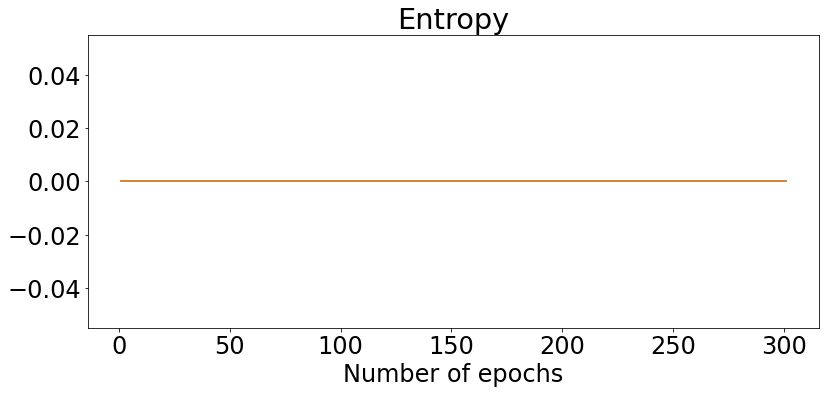

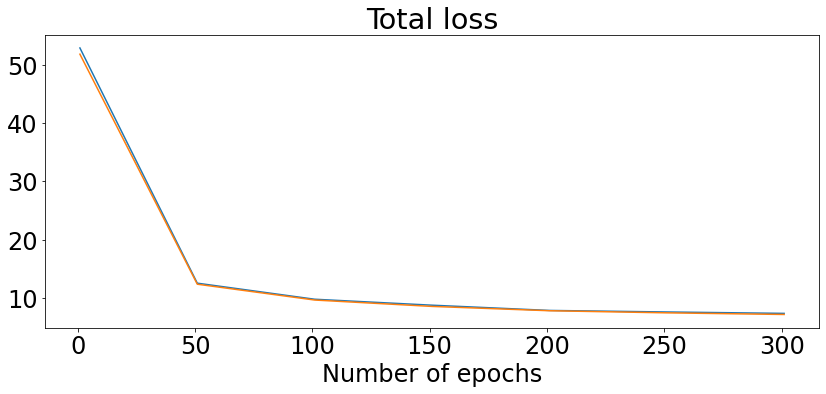

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_10_301_0.3_10000/model.ckpt-301


2022-03-02 17:20:39.188945: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:20:39.189001: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_10_301_0.3_10000/model.ckpt-301


2022-03-02 17:20:39.421547: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:20:39.421602: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_10_301_0.3_10000/model.ckpt-301


2022-03-02 17:20:39.696989: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:20:39.697043: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_10_301_0.3_10000/model.ckpt-301


2022-03-02 17:20:39.990515: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:20:39.990570: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_10_301_0.3_10000/model.ckpt-301


2022-03-02 17:20:40.301692: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:20:40.301759: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


1 clusters found out of 1 allowed
FVE of model: 0.4137261926817811
Finished training in 181.88772463798523
Starting model with latent dimension 5, Gaussian cluster centers 1
graph written


2022-03-02 17:20:43.037822: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:20:43.037877: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.25e+01, -0.00e+00,  5.10e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.23e+01, -0.00e+00,  1.19e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  9.98e+00, -0.00e+00,  9.83e+00,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

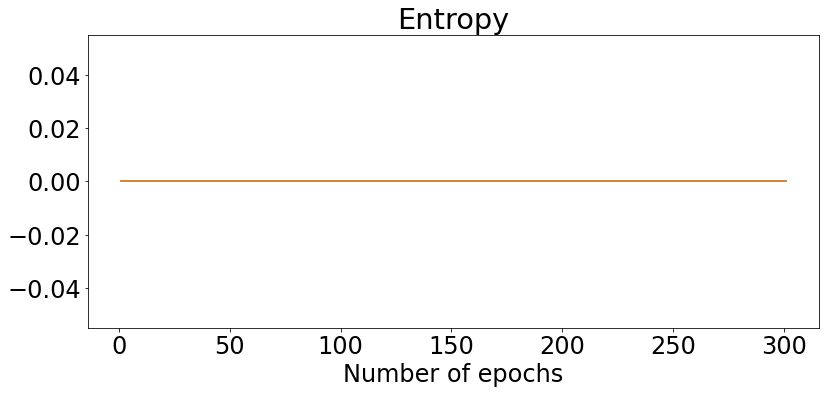

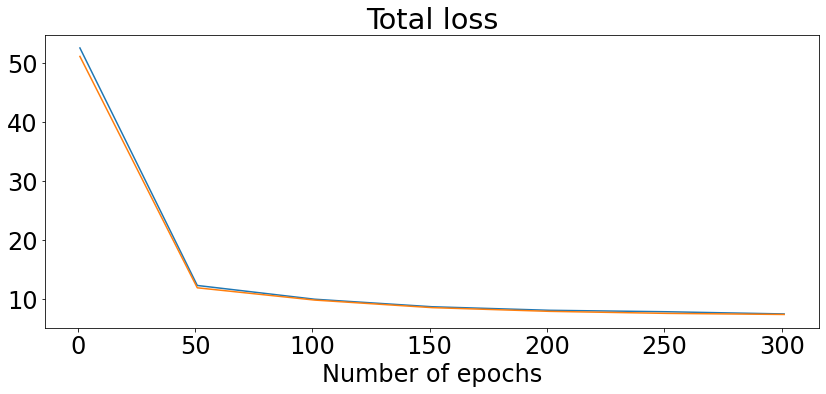

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_5_301_0.3_10000/model.ckpt-301


2022-03-02 17:23:22.171454: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:23:22.171513: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_5_301_0.3_10000/model.ckpt-301


2022-03-02 17:23:22.401583: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:23:22.401638: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_5_301_0.3_10000/model.ckpt-301


2022-03-02 17:23:22.659806: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:23:22.659865: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_5_301_0.3_10000/model.ckpt-301


2022-03-02 17:23:22.935335: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:23:22.935408: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_5_301_0.3_10000/model.ckpt-301


2022-03-02 17:23:23.237764: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:23:23.237818: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


1 clusters found out of 1 allowed
FVE of model: 0.40822416129722106
Finished training in 162.9364652633667
Starting model with latent dimension 3, Gaussian cluster centers 1
graph written


2022-03-02 17:23:26.651238: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:23:26.651301: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.17e+01, -0.00e+00,  5.12e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.04e+01, -0.00e+00,  1.01e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  8.99e+00, -0.00e+00,  8.66e+00,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

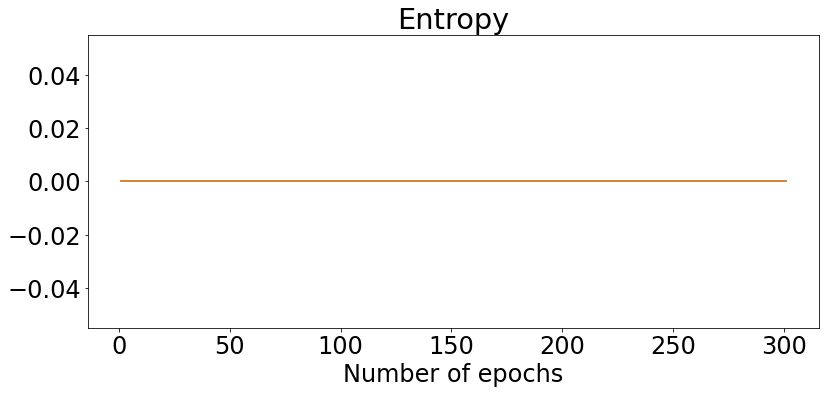

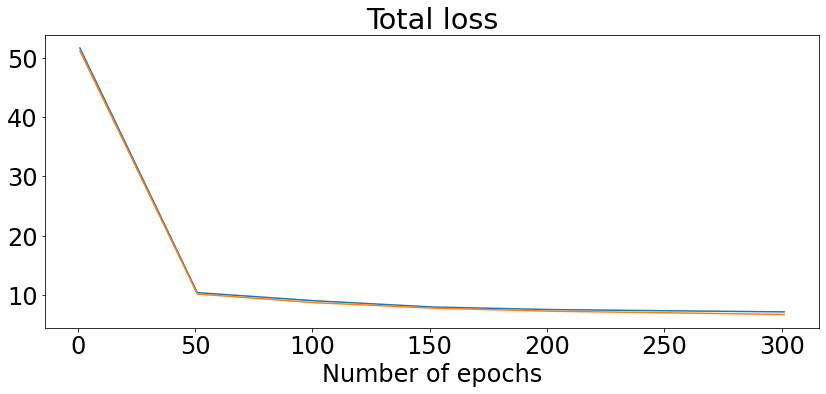

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_301_0.3_10000/model.ckpt-301


2022-03-02 17:26:03.763135: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:26:03.763194: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_301_0.3_10000/model.ckpt-301


2022-03-02 17:26:03.996748: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:26:03.996801: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_301_0.3_10000/model.ckpt-301


2022-03-02 17:26:04.259989: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:26:04.260044: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_301_0.3_10000/model.ckpt-301


2022-03-02 17:26:04.517239: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:26:04.517295: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_301_0.3_10000/model.ckpt-301


2022-03-02 17:26:04.808470: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:26:04.808526: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


1 clusters found out of 1 allowed
FVE of model: 0.4254058237297784
Finished training in 161.56695914268494
Starting model with latent dimension 2, Gaussian cluster centers 1
graph written


2022-03-02 17:26:07.529614: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:26:07.529670: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.12e+01, -0.00e+00,  4.99e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.24e+01, -0.00e+00,  1.19e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.07e+01, -0.00e+00,  1.04e+01,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

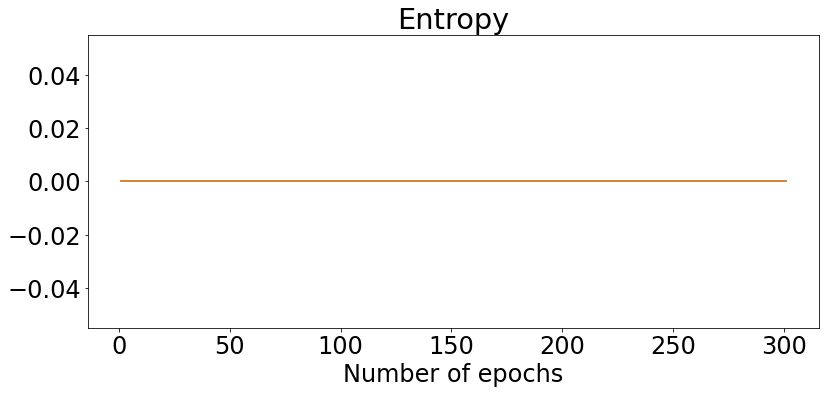

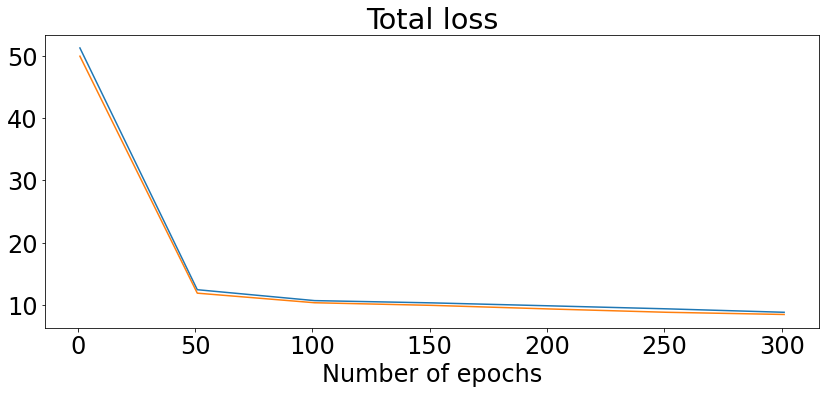

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:28:40.776018: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:28:40.776098: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:28:41.055254: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:28:41.055313: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:28:41.316422: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:28:41.316480: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:28:41.578924: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:28:41.578983: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_2_301_0.3_10000/model.ckpt-301


2022-03-02 17:28:41.877843: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:28:41.877908: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


1 clusters found out of 1 allowed
FVE of model: 0.4082187012200058
Finished training in 157.07344245910645
Starting model with latent dimension 1, Gaussian cluster centers 1
graph written


2022-03-02 17:28:44.594544: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:28:44.594599: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.07e+01, -0.00e+00,  5.01e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.96e+01, -0.00e+00,  1.93e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.71e+01, -0.00e+00,  1.67e+01,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

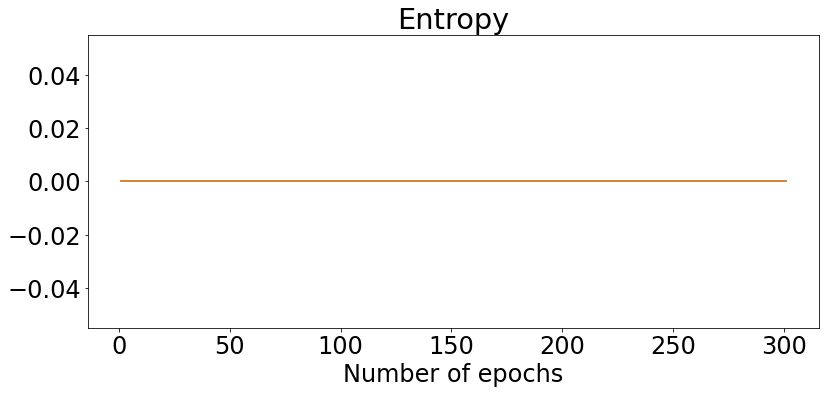

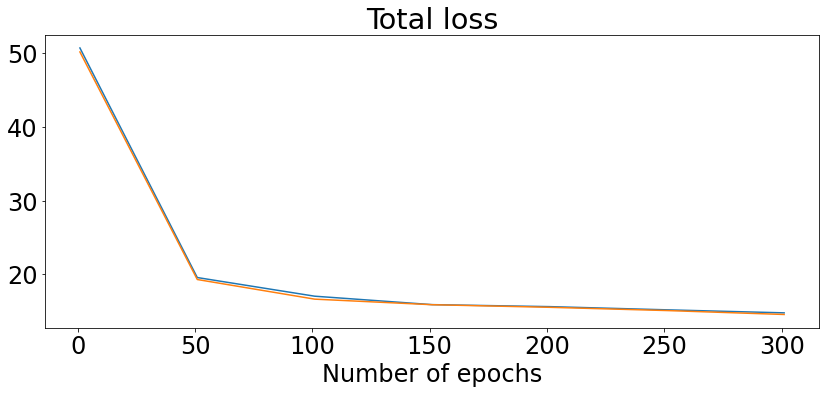

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:31:09.842740: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:31:09.842798: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:31:10.075475: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:31:10.075530: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:31:10.338641: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:31:10.338695: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:31:10.592884: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:31:10.592938: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_1_301_0.3_10000/model.ckpt-301


2022-03-02 17:31:10.889721: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-02 17:31:10.889778: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


1 clusters found out of 1 allowed
FVE of model: 0.3384532794219932
Finished training in 149.0293231010437


In [278]:
k, n_x, n_z, n_epochs = 10, 48, 2, 301
qy_dims = [16,16]
qz_dims = [16,16]
pz_dims = [16,16]
px_dims = [16,16]
r_nent = 0.3
batch_size = 10000
lr = 0.001
modelname='GL13Kmodel_'
n_zs = [10,5,3,2,1]
ks = [10,1]
allmodels = []
modelattrs = []
for k in ks:
    for n_z in n_zs:
        start = time.time()
        print('Starting model with latent dimension {0}, Gaussian cluster centers {1}'.format(n_z,k))
        model = train_gmvae(k,n_x,n_z,n_epochs,
                       qy_dims,qz_dims,pz_dims,px_dims,
                       r_nent,batch_size,lr,modelname)
        z,y_pred,fve = basic_model_assess(model,mostsimdata)
        modelattrs.append((z,y_pred,fve))
        allmodels.append(model)
        end = time.time()
        print("Finished training in {}".format(end-start))

Another possibility is that we aren't actually training for enough epochs, though it looks like the loss has bottomed out pretty strongly.  But it could be worth doing twice the training time just to confirm.

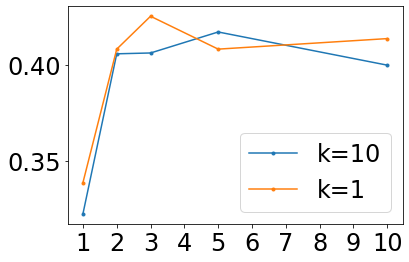

In [290]:
fves = [m[2] for m in modelattrs]
plt.plot([10,5,3,2,1],fves[0:5],'.-')
plt.plot([10,5,3,2,1],fves[5:],'.-')
plt.legend(['k=10','k=1'])
plt.xticks([1,2,3,4,5,6,7,8,9,10]);

Best model is 3-dimensional, k=1 with an FVE of ~43%.  Not...amazing? Above the minimum value for OK CVs, however.  Let's see if we can train it for twice as long just to make sure it isn't a training time thing.

graph written


2022-03-03 07:46:18.780456: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 07:46:18.780814: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  5.31e+01, -0.00e+00,  5.14e+01,         1
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:         50                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  1.11e+01, -0.00e+00,  1.11e+01,        51
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        100                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                              
 -0.00e+00,  9.41e+00, -0.00e+00,  9.15e+00,       101
Sample of qy
1.00 
1.00 
1.00 
1.00 
1.00 

epoch:        150                                                                                   
    tr_ent,   tr_loss,     t_ent,    t_loss,     epoch                                           

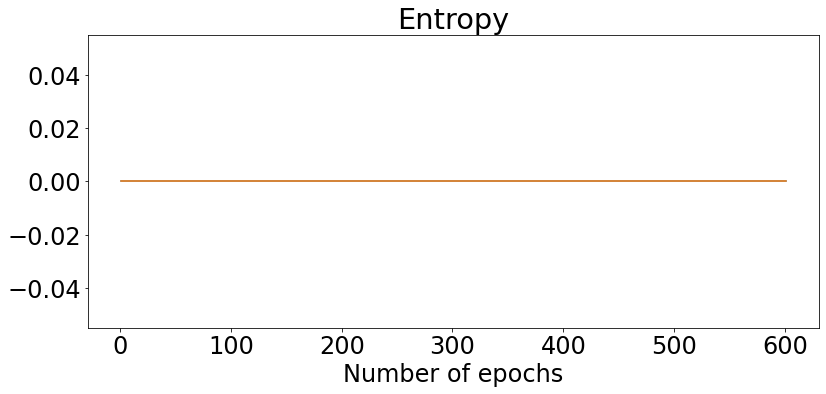

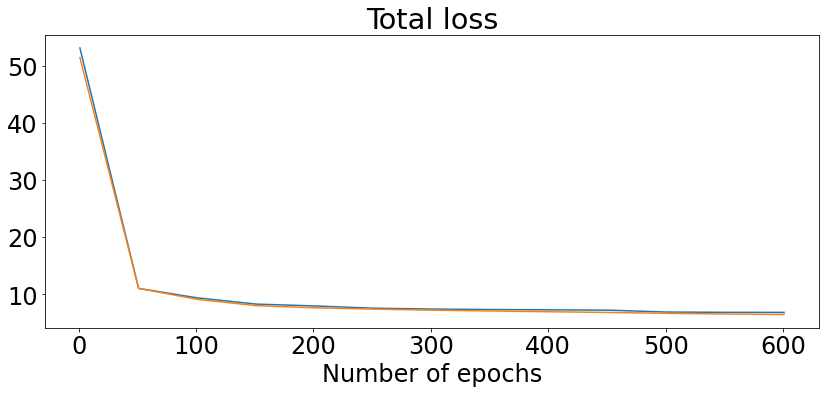

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 07:51:07.960964: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 07:51:07.961036: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 07:51:09.579470: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 07:51:09.579525: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 07:51:10.737946: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 07:51:10.738006: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 07:51:11.224569: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 07:51:11.224619: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 07:51:11.569730: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 07:51:11.569780: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


1 clusters found out of 1 allowed
FVE of model: 0.4152150478008747


In [291]:
k = 1
n_z = 3
n_epochs = 601
model_name = 'GL13Klong'
model = train_gmvae(k,n_x,n_z,n_epochs,
                   qy_dims,qz_dims,pz_dims,px_dims,
                   r_nent,batch_size,lr,modelname)
z,y_pred,fve = basic_model_assess(model,mostsimdata)

In [292]:
fve

0.4152150478008747

Next steps here might be to try out their second set of representations and hyperparameters to see if there's any improvement.

## Quick foray into MSMs
Note that you can divide up the trajectories (obviously you should divide them up into the original but also you may want to divide them up further for quicker model assessment.)

In [295]:
trajencodings = []
y_preds = []
for trajdata in trajdatas:
    qy = model.encode_y(trajdata)
    y_pred = np.argmax(qy, axis=1)
    z = model.encode_z(trajdata)
    trajencodings.append(z)
    y_preds.append(y_pred)

INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:39.940957: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:39.941902: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:41.220922: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:41.220972: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:41.646714: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:41.646762: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:41.974867: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:41.974916: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:42.482685: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:42.482745: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:42.842321: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:42.842372: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:43.159920: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:43.159970: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:43.706291: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:43.706343: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:44.102977: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:44.103027: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:44.410957: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:44.411024: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:44.956608: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:44.956658: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:45.319382: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:45.319436: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:45.737366: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:45.737422: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:46.279267: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:46.279315: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:46.655724: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:46.655773: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:47.041694: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:47.041744: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:47.626135: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:47.626185: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:48.019862: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:48.019918: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:48.440140: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:48.440189: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:49.058293: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:49.058343: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


INFO:tensorflow:Restoring parameters from models/GL13Kmodel_1_3_601_0.3_10000/model.ckpt-601


2022-03-03 11:58:49.491945: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1159] Device interconnect StreamExecutor with strength 1 edge matrix:
2022-03-03 11:58:49.491995: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1165]      


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
plt.rcParams.update({'font.size': 24})
cklag = 10
its = pyemma.msm.its(y_pred_list, lags=[1, 2, 3, 4, 5, 10, 15, 20, 25], errors='bayes')
fig, axes = plt.subplots(nrows=1, ncols = 1, figsize=(8,6))
pyemma.plots.plot_implied_timescales(its, marker = 'o', ylog=True, units='steps', ax = axes, linewidth=3)
axes.axvline(cklag, color ='black', linewidth = 3, linestyle='--'  )
titlename = "its"
axes.set_xlabel('Time (steps)', labelpad=20)
axes.set_ylabel('Timescale (steps)', labelpad=20)
fig.savefig(str(results_dir) + '/its.png', bbox_inches='tight')